# LSTM supervised model for anomaly detection

## Import libraries

In [3]:
import numpy as np
import pandas as pd
import os
from time import time

import warnings
warnings.filterwarnings('ignore')

from slidingWindows import find_length,plotFig
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tqdm import tqdm


c:\ProgramData\anaconda3\envs\TSB\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\ProgramData\anaconda3\envs\TSB\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
c:\ProgramData\anaconda3\envs\TSB\lib\site-packages\numpy\.libs\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


### Data and model utils

In [4]:
def data_preprocessing(filepath):

    # Prepare data for unsupervised method
    df = pd.read_csv(filepath, header=None).dropna().to_numpy()

    name = filepath.split('/')[-1]

    data = df[:,0].astype(float)
    label = df[:,1].astype(int)
        
    slidingWindow = find_length(data)

    # Check if "Dodgers" is the first dataset in the filename
    if "normality1_Dodgers" in name or "normality2_Dodgers" in name or "normality3_Dodgers" in name:
        # Skip the first 500 points for this specific case
        data = data[500:]
        label = label[500:]

    data_train = data[:int(0.15*len(data))]
    label_train = label[:int(0.15*len(data))]
    data_test = data[int(0.15*len(data)):]
    label_test = label[int(0.15*len(data)):]

    print(name)
    print("Estimated Subsequence length: ",slidingWindow)
    print("Time series length: ",len(data))
    print("Number of abnormal points: ",list(label).count(1))

    return name, slidingWindow, data, label, data_train, label_train, data_test, label_test

def plot_sequences(X_train, y_train, X_test, y_test, slidingWindow):
    def plot_sequence(X, y, slidingWindow, title):
        plt.figure(figsize=(14, 6))
        
        # Create segments and colors for the LineCollection
        points = np.array([np.arange(len(X)), X]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        colors = ['b' if label == 0 else 'r' for label in y]

        lc = LineCollection(segments, colors=colors, linewidths=2)
        plt.gca().add_collection(lc)

        plt.xlim(0, len(X))
        plt.ylim(min(X) - 1, max(X) + 1)
        plt.title(title)
        plt.xlabel('Index')
        plt.ylabel('Value')
        plt.show()

    # Plot for X_train
    plot_sequence(X_train, y_train, slidingWindow, 'X_train Sequence with Normal (Blue) and Abnormal (Red) Points')

    # Plot for X_test
    plot_sequence(X_test, y_test, slidingWindow, 'X_test Sequence with Normal (Blue) and Abnormal (Red) Points and Sliding Window Lines')

In [21]:
def create_lstm_model(learning_rate):
    model = tf.keras.models.Sequential([
        tf.keras.layers.LSTM(256),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy')
    return model

def generate_sliding_windows(X_data, y_data, window_size, shift):
    X, y = [], []
    for i in range(len(X_data) - window_size):
        X.append(X_data[i:(i + window_size)])
        y.append(y_data[i + window_size-1])
    return np.array(X), np.array(y)

def train_lstm_model(X_train, y_train, X_val=None, y_val=None, window_size=50,shift=1):

    NUM_EPOCHS = 1000
    LEARNING_RATE = 0.0001

    X_train_samples, y_train_samples = generate_sliding_windows(X_train, y_train, window_size, shift)
    
    # Reshape X_train_samples to fit LSTM input shape
    X_train_samples = X_train_samples.reshape((X_train_samples.shape[0], X_train_samples.shape[1], 1))
    model = create_lstm_model(learning_rate=LEARNING_RATE)

    # Fit the model
    if X_val is not None:
        X_val_samples, y_val_samples = generate_sliding_windows(X_val, y_val, window_size, shift)
        X_val_samples = X_val_samples.reshape((X_val_samples.shape[0], X_val_samples.shape[1], 1))

        # Define callbacks
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, min_delta=0.000001)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)
        model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss', mode='min')
        
        callbacks = [early_stopping, reduce_lr, model_checkpoint]
        history = model.fit(X_train_samples, y_train_samples, epochs=NUM_EPOCHS, batch_size=256,
                            validation_data=(X_val_samples, y_val_samples), callbacks=callbacks, verbose=0)
    else:

        # Define callbacks
        early_stopping = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True, min_delta=0.000001)
        reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.5, patience=3, min_lr=1e-7)
        model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='loss', mode='min')
        
        callbacks = [early_stopping, reduce_lr, model_checkpoint]
        history = model.fit(X_train_samples, y_train_samples, epochs=NUM_EPOCHS, callbacks=callbacks, batch_size=256, verbose=0)

    return model

def generate_sliding_windows_1(data, window_size, shift):
    X = []
    for i in range(len(data) - window_size + 1):
        X.append(data[i:(i + window_size)])
    return np.array(X)

def process_offline(model, X_test, window_size=50, shift=1):
    # Generate sliding windows from X_test
    X_test_windows = generate_sliding_windows_1(X_test, window_size, shift)
    scores = []

    for i in tqdm(range(len(X_test_windows)), desc="Processing batches"):
        X_batch = X_test_windows[i]
        if len(X_batch) == 0:
            break 
        # Reshape X_batch to fit LSTM input shape
        X_batch = X_batch.reshape((1, X_batch.shape[0], 1))
        
        y_pred = model.predict(X_batch, verbose=0)
        scores.extend(y_pred.ravel())
    
    # Scale scores to range (0, 1)
    scores = MinMaxScaler(feature_range=(0, 1)).fit_transform(np.array(scores).reshape(-1, 1)).ravel()
    return scores

def process_in_batches(model, X_test, batch_size=64, window_size=50, shift=1):
    # Generate sliding windows from X_test
    X_test_windows = generate_sliding_windows_1(X_test, window_size, shift)
    
    n_batches = len(X_test_windows) // batch_size
    scores = []

    for i in tqdm(range(n_batches + 1), desc="Processing batches"):
        start = i * batch_size
        end = start + batch_size
        X_batch = X_test_windows[start:end]
        
        if len(X_batch) == 0:
            break
        
        # Reshape X_batch to fit LSTM input shape
        X_batch = X_batch.reshape((X_batch.shape[0], X_batch.shape[1], 1))
        
        y_pred = model.predict(X_batch, verbose=0)
        scores.extend(y_pred.ravel())
    
    # Scale scores to range (0, 1)
    scores = MinMaxScaler(feature_range=(0, 1)).fit_transform(np.array(scores).reshape(-1, 1)).ravel()
    return scores

# Function to simulate streaming environment with pseudo-labeling and a progress bar
def process_in_batches_with_pseudo_labeling(model, X_test, batch_size=64, confidence_threshold=0.9, window_size=50, shift=1):

    # Generate sliding windows from X_test
    X_test_windows = generate_sliding_windows_1(X_test, window_size, shift)
    
    n_batches = len(X_test_windows) // batch_size
    scores = []

    buffer_X_data = []
    buffer_y_data = []
    for i in tqdm(range(n_batches + 1), desc="Processing batches"):
        start = i * batch_size
        end = start + batch_size
        X_batch = X_test_windows[start:end]
        if len(X_batch) == 0:
            break

        # Reshape X_batch to fit LSTM input shape
        X_batch = X_batch.reshape((X_batch.shape[0], X_batch.shape[1], 1))
        
        y_pred = model.predict(X_batch, verbose=0)
        scores.extend(y_pred.ravel())

        if buffer_X_data==[]:
            buffer_X_data = X_batch
        else: 
            buffer_X_data = np.concatenate([buffer_X_data,X_batch])
        if buffer_y_data==[]:
            buffer_y_data = y_pred
        else: 
            buffer_y_data = np.concatenate([buffer_y_data,y_pred])

        # Identify high confidence predictions
        # Create the new array based on the threshold
        if i%10 == 0 and i!=0:
            y_pred_confident = MinMaxScaler(feature_range=(0,1)).fit_transform(np.array(buffer_y_data).reshape(-1, 1)).ravel()
            y_pred_confident = np.where(y_pred_confident > confidence_threshold, 1, 0)
            model.fit(buffer_X_data, y_pred_confident, epochs=1, verbose=0, batch_size=256)
            buffer_X_data = []
            buffer_y_data = []

    # Scale scores to range (0,1)
    scores = MinMaxScaler(feature_range=(0,1)).fit_transform(np.array(scores).reshape(-1, 1)).ravel()
    return scores

### Load datasets and train lstm models on train sets

In [22]:
# Directory containing the .out files
directory = 'generated_data'

# Initialize an empty list to store the file paths
file_paths = []

# Walk through the directory
for filename in os.listdir(directory):
    if filename.endswith('.out'):
        # Construct the full file path
        full_path = os.path.join(directory, filename)
        # Append the full path to the list
        file_paths.append(full_path)

generated_data\normality1_Dodgers.out
Estimated Subsequence length:  288
Time series length:  49900
Number of abnormal points:  5233
Total points in train set: 7485
Number of abnormal points in train set: 486


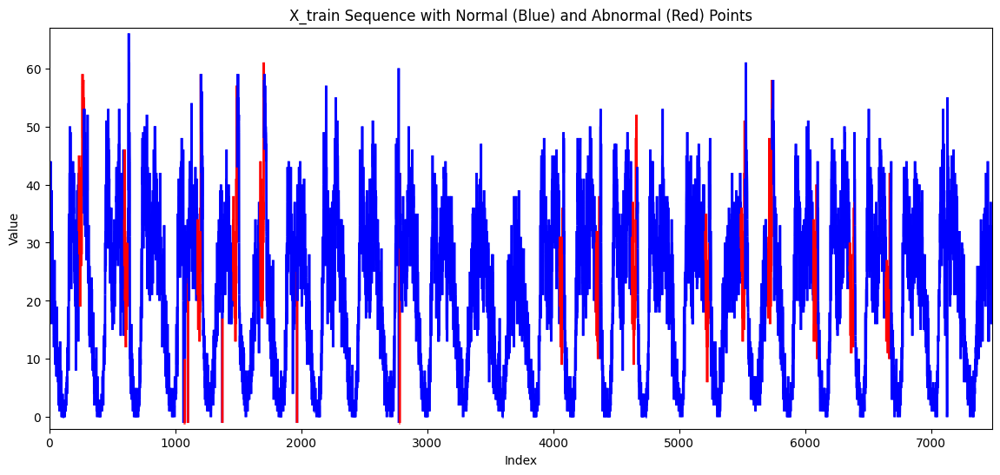

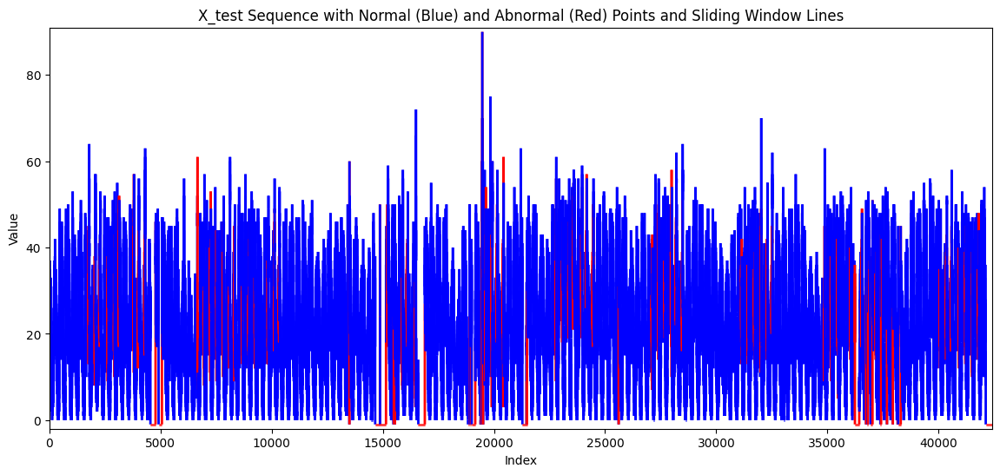

generated_data\normality1_MGAB.out
Estimated Subsequence length:  49
Time series length:  100000
Number of abnormal points:  200
Total points in train set: 15000
Number of abnormal points in train set: 0


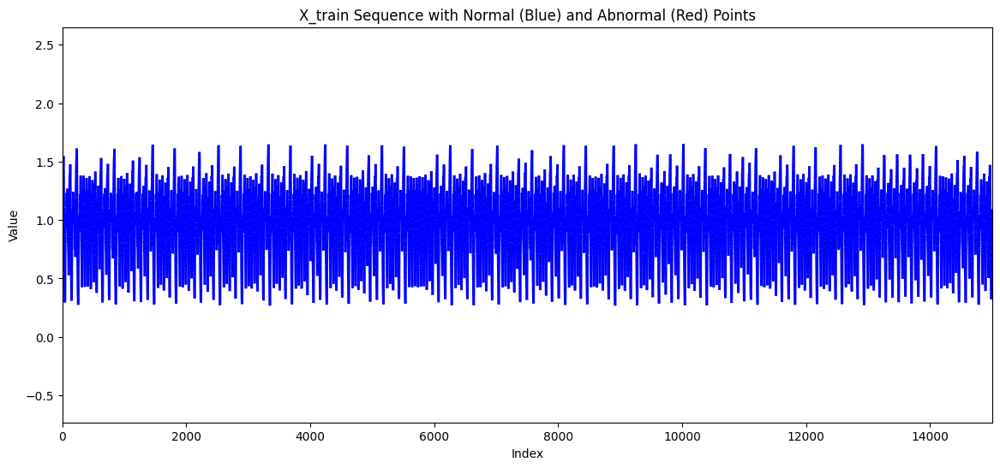

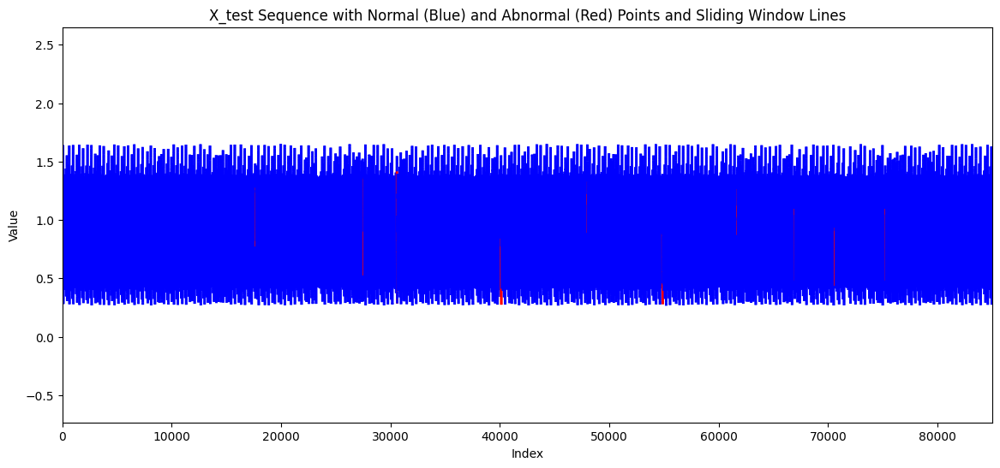

generated_data\normality1_NAB.out
Estimated Subsequence length:  289
Time series length:  4031
Number of abnormal points:  400
Total points in train set: 604
Number of abnormal points in train set: 0


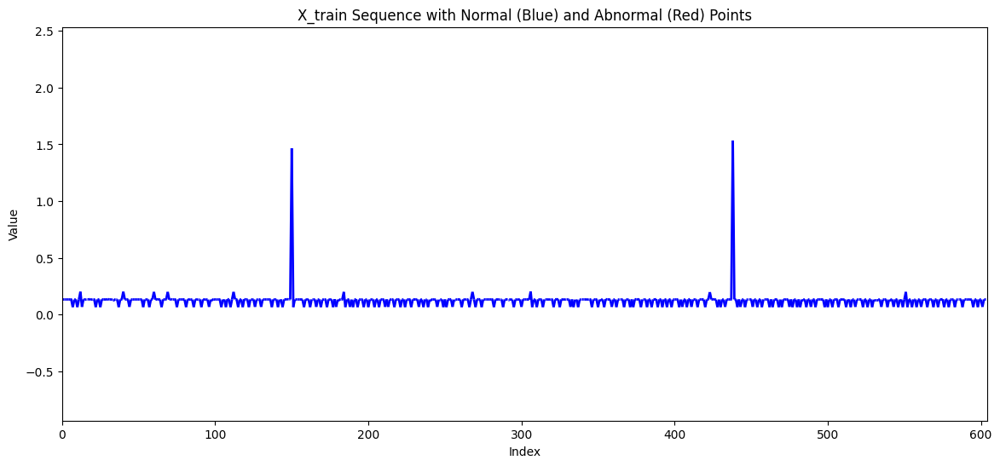

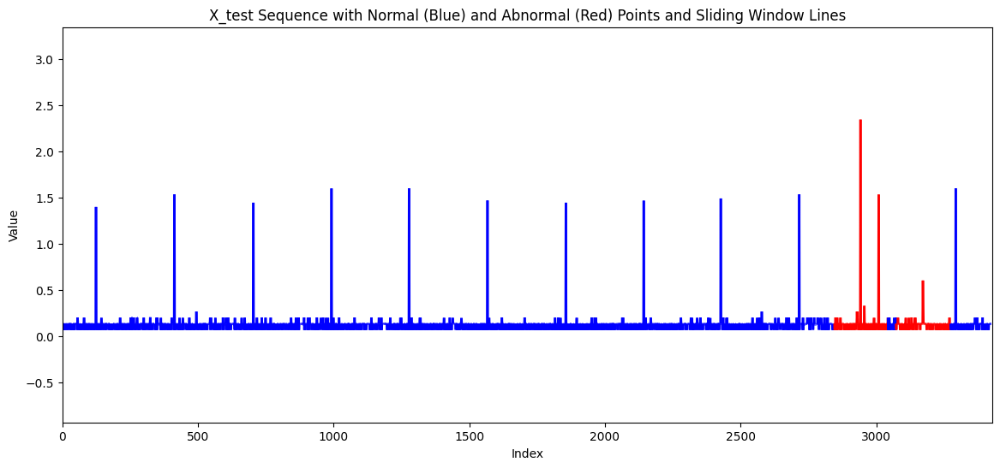

In [23]:
for filepath in file_paths[:3]:
    name, slidingWindow, data, label, X_train, y_train, X_test, y_test = data_preprocessing(filepath)
    print(f"Total points in train set: {X_train.shape[0]}")
    print(f"Number of abnormal points in train set: {sum(y_train==1)}")
    plot_sequences(X_train, y_train, X_test, y_test, slidingWindow)

In [8]:
models = {}

In [9]:
for filepath in file_paths:

    name, slidingWindow, data, label, X_train_val, y_train_val, X_test, y_test = data_preprocessing(filepath)
    if "normality2_Dodgers" in name or "normality3_Dodgers" in name:
        model = models['generated_data\\normality1_Dodgers.out']
    elif "normality2_MGAB" in name or "normality3_MGAB" in name:
        model = models['generated_data\\normality1_MGAB.out']
    elif "normality2_NAB" in name or "normality3_NAB" in name:
        model = models['generated_data\\normality1_NAB.out']
    else:
        start_time = time()

        X_train = X_train_val[:int(0.8*len(X_train_val))]
        y_train = y_train_val[:int(0.8*len(X_train_val))]
        X_val = X_train_val[int(0.8*len(X_train_val)):]
        y_val = y_train_val[int(0.8*len(X_train_val)):]
        model = train_lstm_model(X_train.reshape((-1, 1, 1)), y_train, X_val=X_val.reshape((-1, 1, 1)), y_val=y_val)
        end_time = time()

        print(f"Model for {filepath} trained succesfuly in {(end_time-start_time):.1f} s.")

    models[filepath] = model


generated_data\normality1_Dodgers.out
Estimated Subsequence length:  288
Time series length:  49900
Number of abnormal points:  5233
Model for generated_data\normality1_Dodgers.out trained succesfuly in 119.0 s.
generated_data\normality1_MGAB.out
Estimated Subsequence length:  49
Time series length:  100000
Number of abnormal points:  200
Model for generated_data\normality1_MGAB.out trained succesfuly in 253.8 s.
generated_data\normality1_NAB.out
Estimated Subsequence length:  289
Time series length:  4031
Number of abnormal points:  400
Model for generated_data\normality1_NAB.out trained succesfuly in 19.8 s.
generated_data\normality2_Dodgers_MGAB.out
Estimated Subsequence length:  288
Time series length:  149900
Number of abnormal points:  5433
generated_data\normality2_Dodgers_NAB.out
Estimated Subsequence length:  288
Time series length:  53931
Number of abnormal points:  5633
generated_data\normality2_MGAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  150400
N

## Offline option

In [25]:
WINDOW_SIZE= 50

generated_data\normality1_Dodgers.out
Estimated Subsequence length:  288
Time series length:  49900
Number of abnormal points:  5233


Processing batches: 100%|██████████| 1/1 [00:43<00:00, 43.24s/it]


generated_data\normality1_MGAB.out
Estimated Subsequence length:  49
Time series length:  100000
Number of abnormal points:  200


Processing batches: 100%|██████████| 1/1 [01:25<00:00, 85.10s/it]


generated_data\normality1_NAB.out
Estimated Subsequence length:  289
Time series length:  4031
Number of abnormal points:  400


Processing batches: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


generated_data\normality2_Dodgers_MGAB.out
Estimated Subsequence length:  288
Time series length:  149900
Number of abnormal points:  5433


Processing batches: 100%|██████████| 1/1 [01:53<00:00, 113.35s/it]


generated_data\normality2_Dodgers_NAB.out
Estimated Subsequence length:  288
Time series length:  53931
Number of abnormal points:  5633


Processing batches: 100%|██████████| 1/1 [00:40<00:00, 40.95s/it]


generated_data\normality2_MGAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  150400
Number of abnormal points:  5812


Processing batches: 100%|██████████| 1/1 [01:54<00:00, 114.37s/it]


generated_data\normality2_MGAB_NAB.out
Estimated Subsequence length:  49
Time series length:  104031
Number of abnormal points:  600


Processing batches: 100%|██████████| 1/1 [01:19<00:00, 79.56s/it]


generated_data\normality2_NAB_Dodgers.out
Estimated Subsequence length:  288
Time series length:  54431
Number of abnormal points:  6012


Processing batches: 100%|██████████| 1/1 [00:40<00:00, 40.98s/it]


generated_data\normality2_NAB_MGAB.out
Estimated Subsequence length:  49
Time series length:  104031
Number of abnormal points:  600


Processing batches: 100%|██████████| 1/1 [01:16<00:00, 76.34s/it]


generated_data\normality3_Dodgers_MGAB_NAB.out
Estimated Subsequence length:  288
Time series length:  153931
Number of abnormal points:  5833


Processing batches: 100%|██████████| 1/1 [02:07<00:00, 127.34s/it]


generated_data\normality3_Dodgers_NAB_MGAB.out
Estimated Subsequence length:  288
Time series length:  153931
Number of abnormal points:  5833


Processing batches: 100%|██████████| 1/1 [01:54<00:00, 114.70s/it]


generated_data\normality3_MGAB_Dodgers_NAB.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 1/1 [02:03<00:00, 123.17s/it]


generated_data\normality3_MGAB_NAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 1/1 [02:01<00:00, 121.84s/it]


generated_data\normality3_NAB_Dodgers_MGAB.out
Estimated Subsequence length:  288
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 1/1 [02:02<00:00, 122.79s/it]


generated_data\normality3_NAB_MGAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 1/1 [01:51<00:00, 111.96s/it]


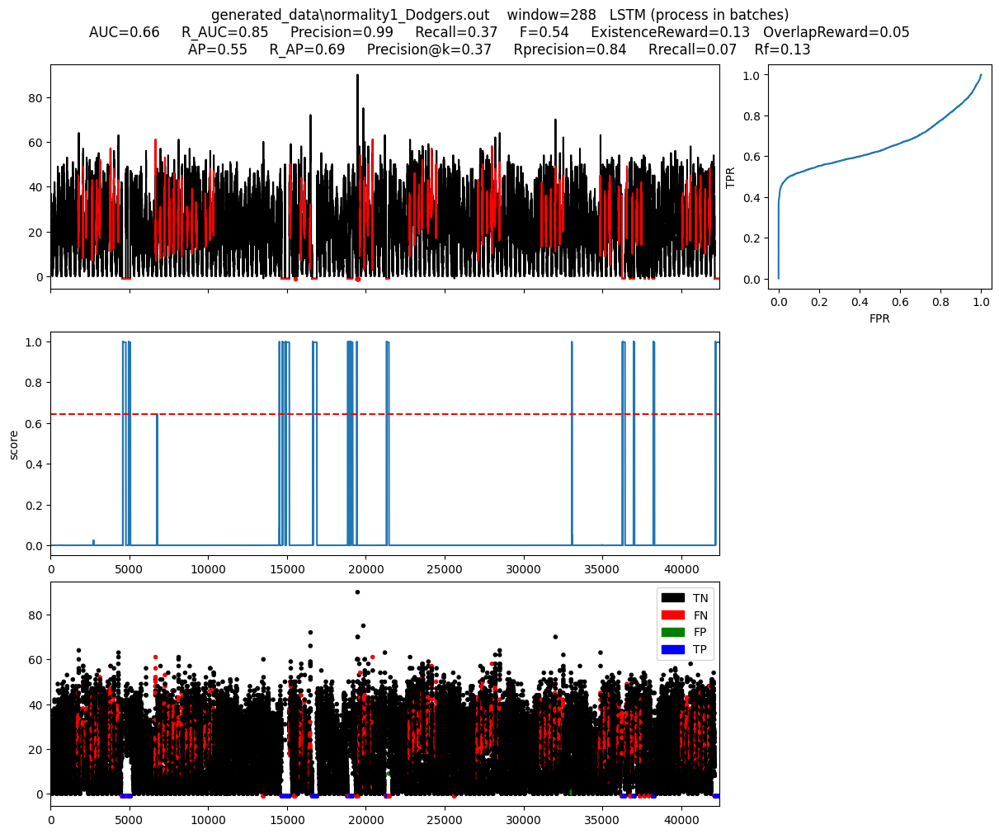

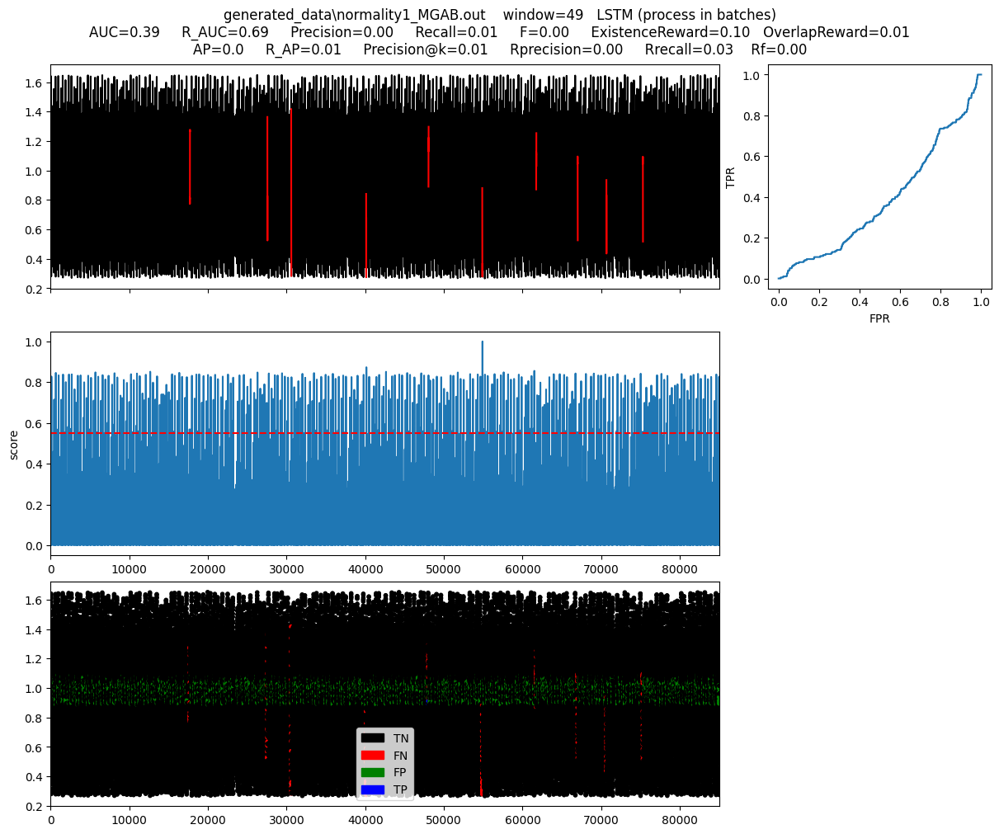

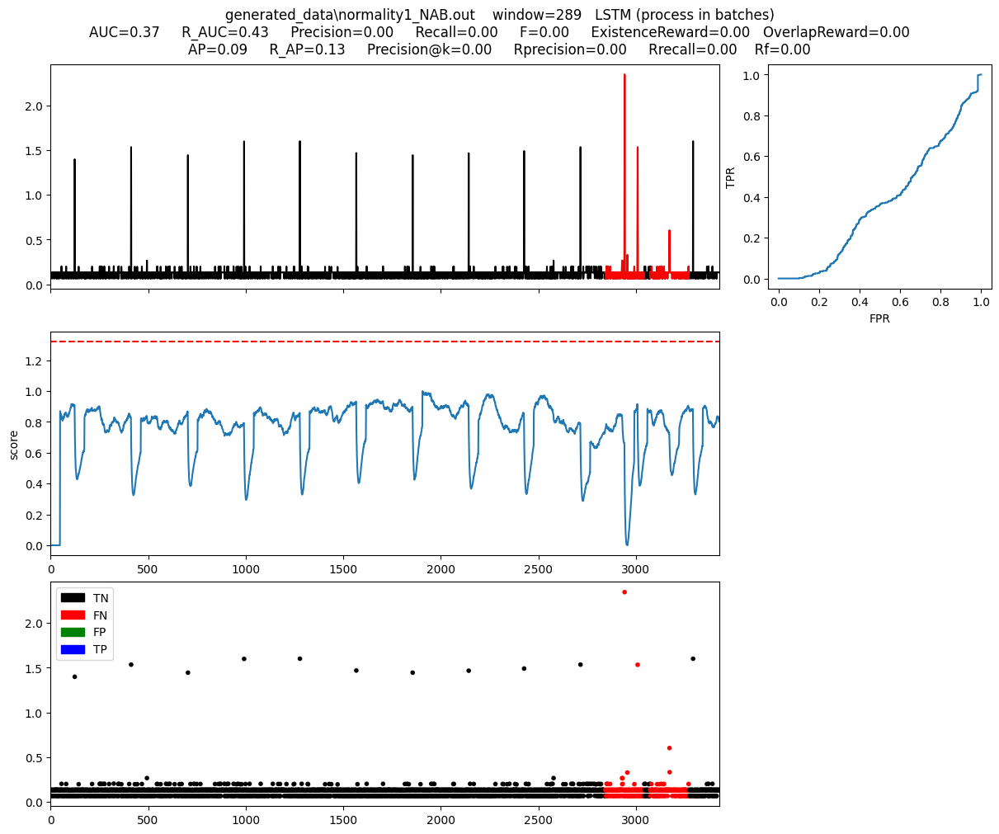

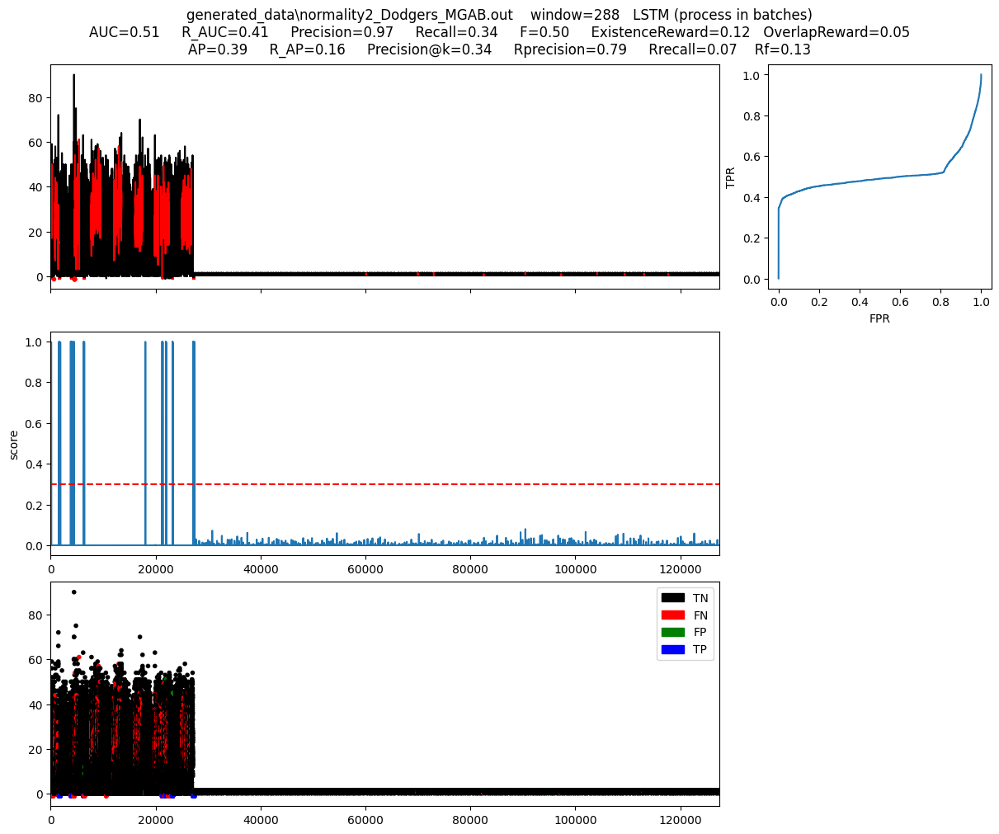

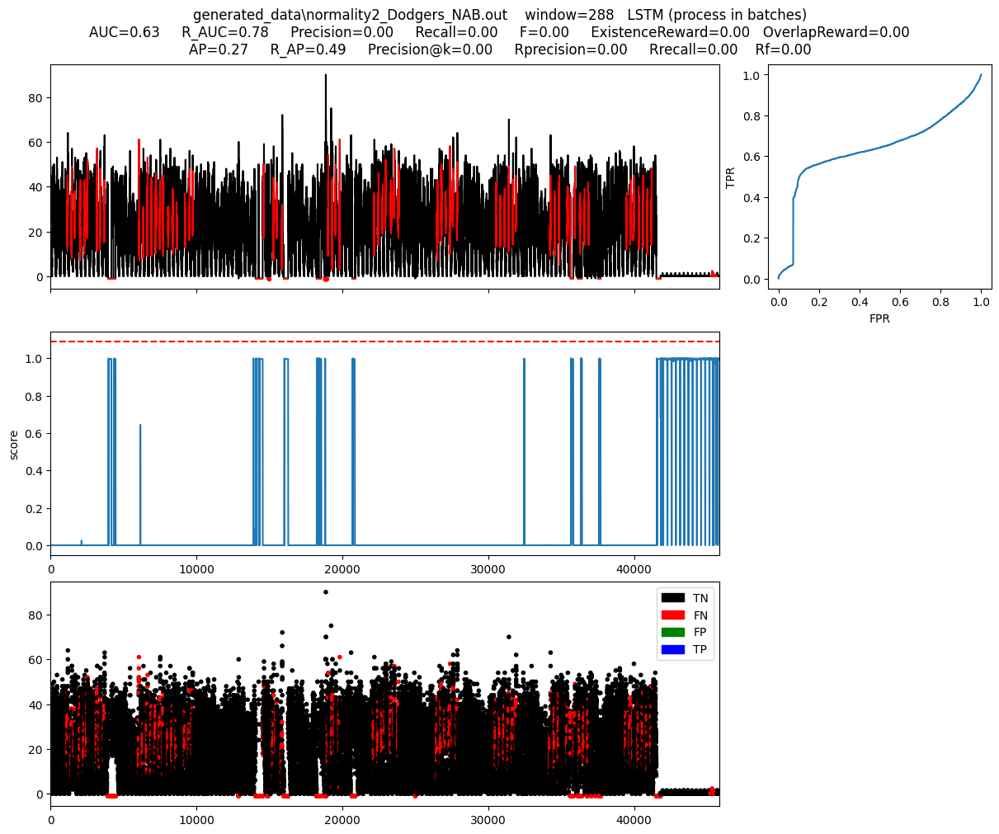

...

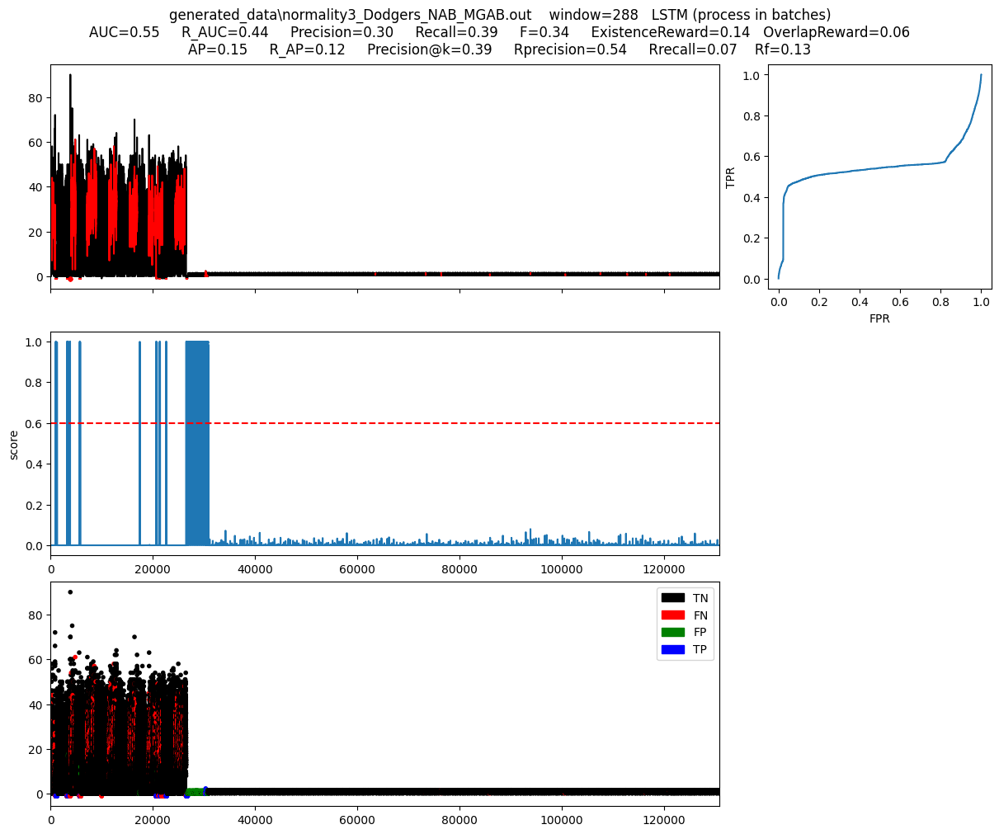

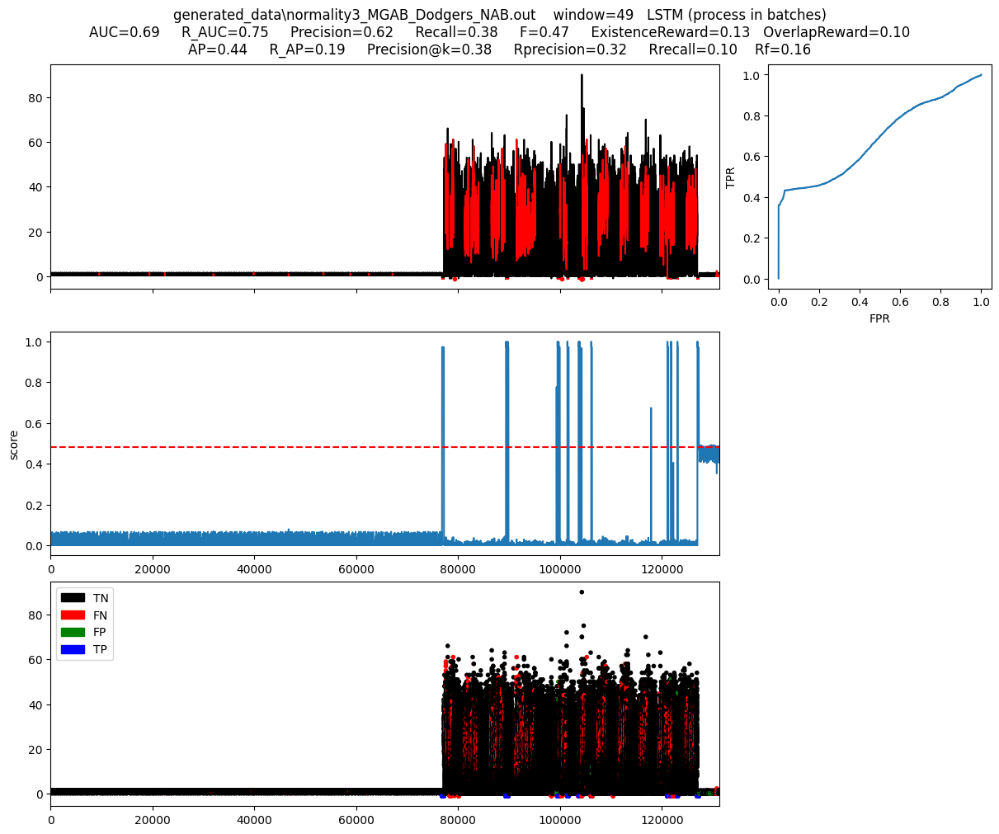

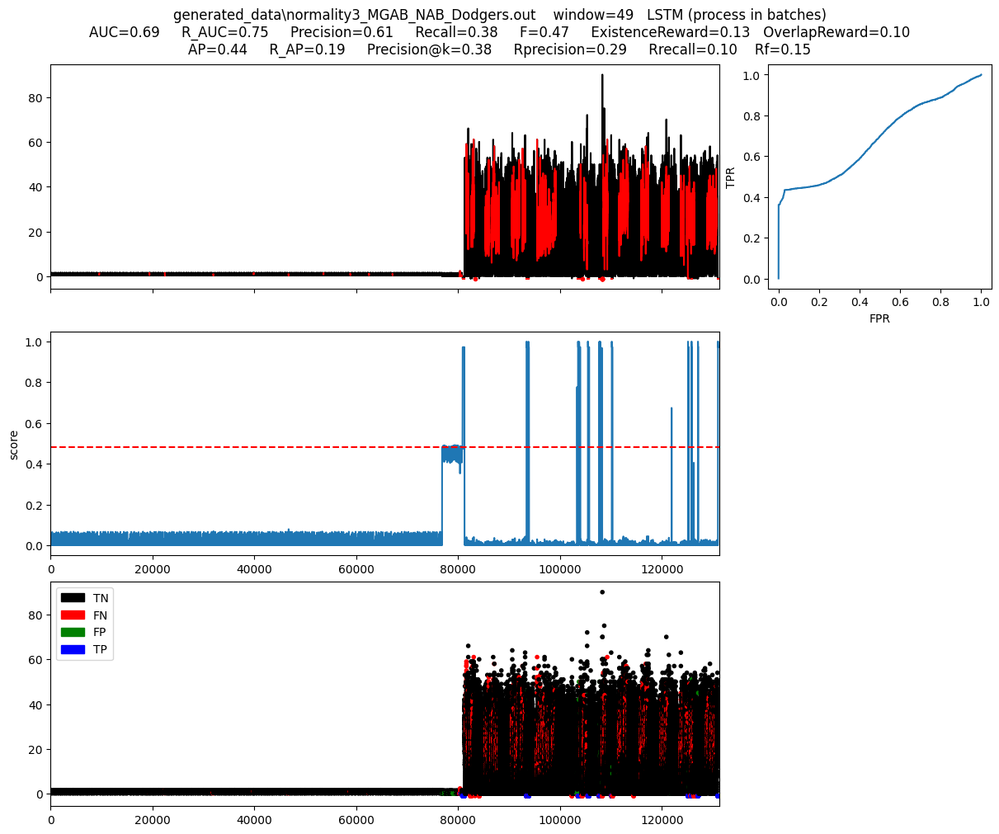

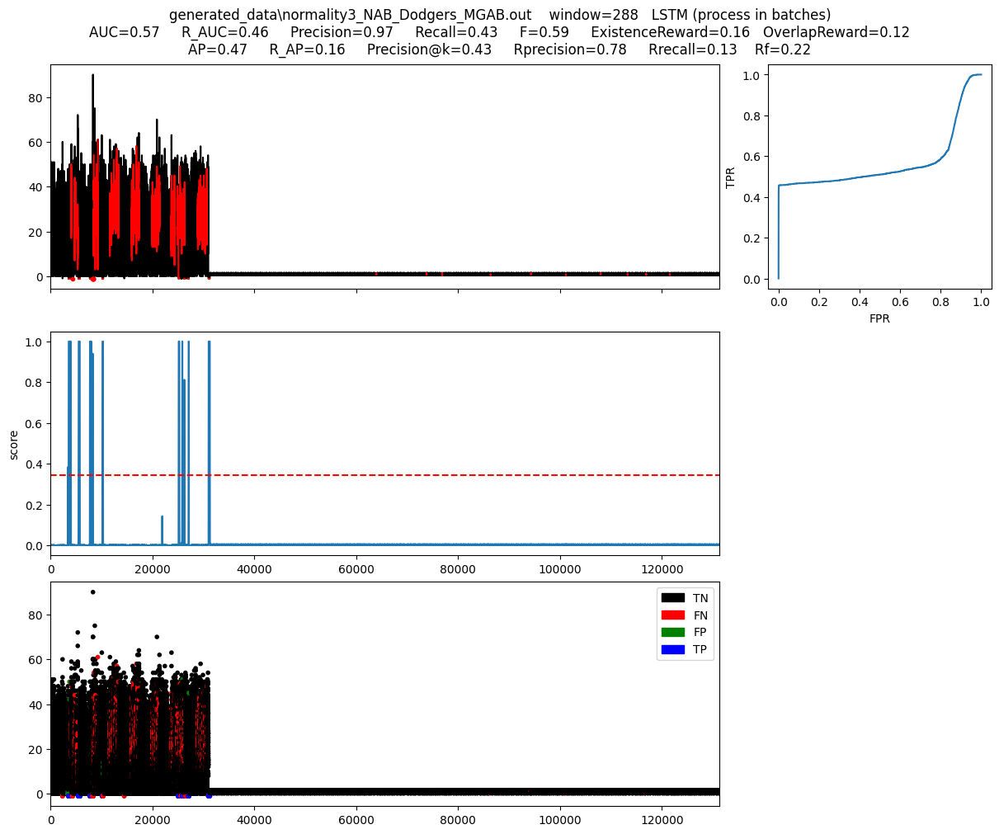

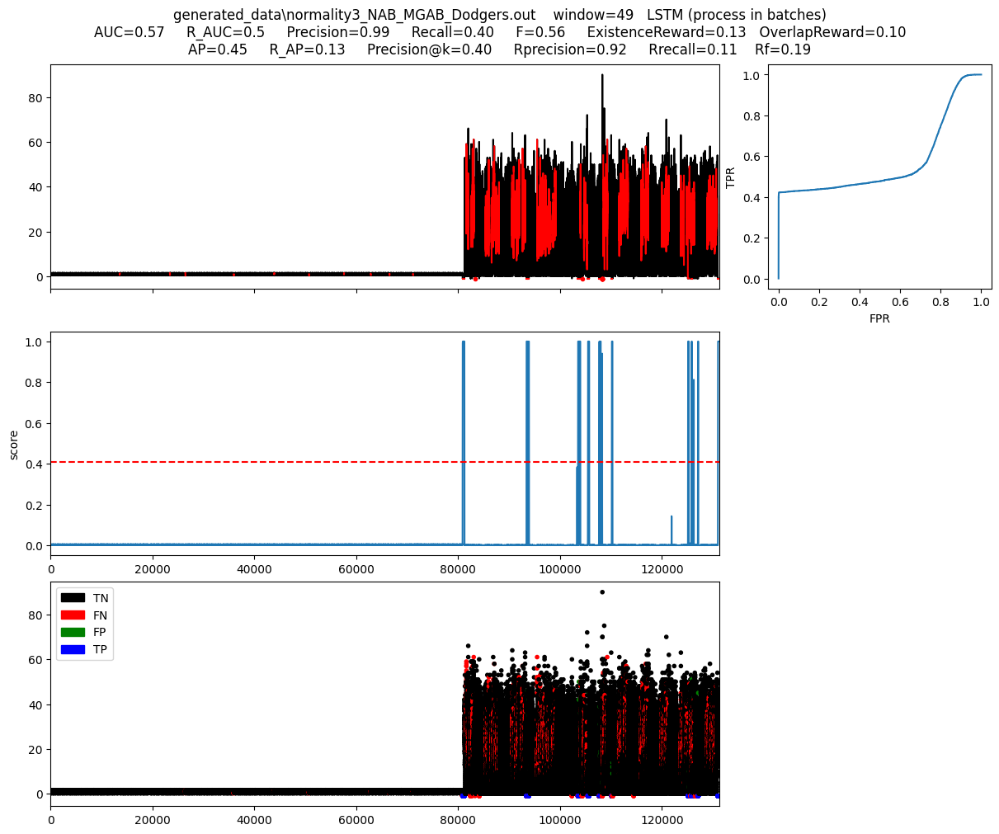

In [26]:
for filepath in file_paths:
    name, slidingWindow, data, label, X_train, y_train, X_test, y_test = data_preprocessing(filepath)
    X_test_reshaped = X_test.reshape((-1, 1, 1))

    model = models[filepath]
    # Process test data in batches to simulate streaming
    score = process_in_batches(model, X_test, batch_size=len(X_test))
    
    zeros = np.zeros(WINDOW_SIZE-1)
    new_score = np.concatenate((zeros,score))
    plotFig(X_test, y_test, new_score, slidingWindow, fileName=name, modelName="LSTM (process in batches)")

## Online options
Train a simple lstm model and detect anomalies in the test set

In [10]:
BATCH_SIZE = 1000
WINDOW_SIZE= 50

### Variation 1 - Process in batches

generated_data\normality1_Dodgers.out
Estimated Subsequence length:  288
Time series length:  49900
Number of abnormal points:  5233


Processing batches: 100%|██████████| 43/43 [00:37<00:00,  1.16it/s]


generated_data\normality1_MGAB.out
Estimated Subsequence length:  49
Time series length:  100000
Number of abnormal points:  200


Processing batches: 100%|██████████| 85/85 [01:14<00:00,  1.14it/s]


generated_data\normality1_NAB.out
Estimated Subsequence length:  289
Time series length:  4031
Number of abnormal points:  400


Processing batches: 100%|██████████| 4/4 [00:03<00:00,  1.21it/s]


generated_data\normality2_Dodgers_MGAB.out
Estimated Subsequence length:  288
Time series length:  149900
Number of abnormal points:  5433


Processing batches: 100%|██████████| 128/128 [01:43<00:00,  1.24it/s]


generated_data\normality2_Dodgers_NAB.out
Estimated Subsequence length:  288
Time series length:  53931
Number of abnormal points:  5633


Processing batches: 100%|██████████| 46/46 [00:36<00:00,  1.27it/s]


generated_data\normality2_MGAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  150400
Number of abnormal points:  5812


Processing batches: 100%|██████████| 128/128 [01:43<00:00,  1.23it/s]


generated_data\normality2_MGAB_NAB.out
Estimated Subsequence length:  49
Time series length:  104031
Number of abnormal points:  600


Processing batches: 100%|██████████| 89/89 [01:12<00:00,  1.24it/s]


generated_data\normality2_NAB_Dodgers.out
Estimated Subsequence length:  288
Time series length:  54431
Number of abnormal points:  6012


Processing batches: 100%|██████████| 47/47 [01:06<00:00,  1.42s/it]


generated_data\normality2_NAB_MGAB.out
Estimated Subsequence length:  49
Time series length:  104031
Number of abnormal points:  600


Processing batches: 100%|██████████| 89/89 [02:12<00:00,  1.49s/it]


generated_data\normality3_Dodgers_MGAB_NAB.out
Estimated Subsequence length:  288
Time series length:  153931
Number of abnormal points:  5833


Processing batches: 100%|██████████| 131/131 [03:11<00:00,  1.46s/it]


generated_data\normality3_Dodgers_NAB_MGAB.out
Estimated Subsequence length:  288
Time series length:  153931
Number of abnormal points:  5833


Processing batches: 100%|██████████| 131/131 [03:12<00:00,  1.47s/it]


generated_data\normality3_MGAB_Dodgers_NAB.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [03:08<00:00,  1.43s/it]


generated_data\normality3_MGAB_NAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [02:58<00:00,  1.35s/it]


generated_data\normality3_NAB_Dodgers_MGAB.out
Estimated Subsequence length:  288
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [03:20<00:00,  1.52s/it]


generated_data\normality3_NAB_MGAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [03:01<00:00,  1.37s/it]


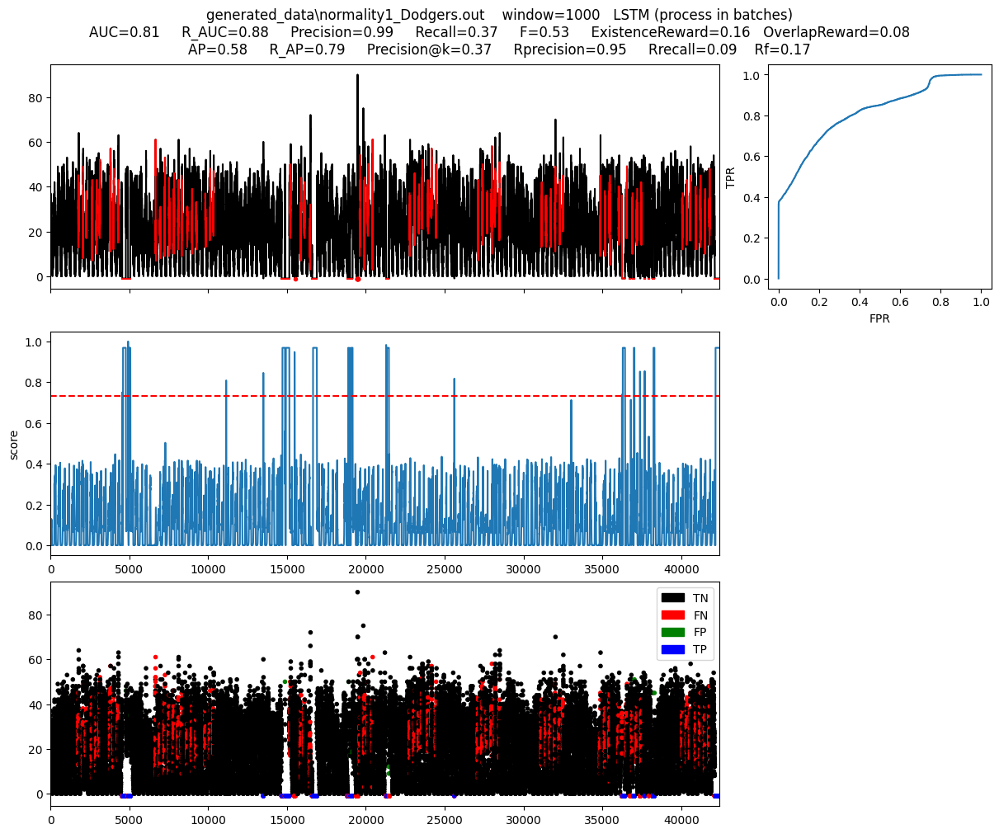

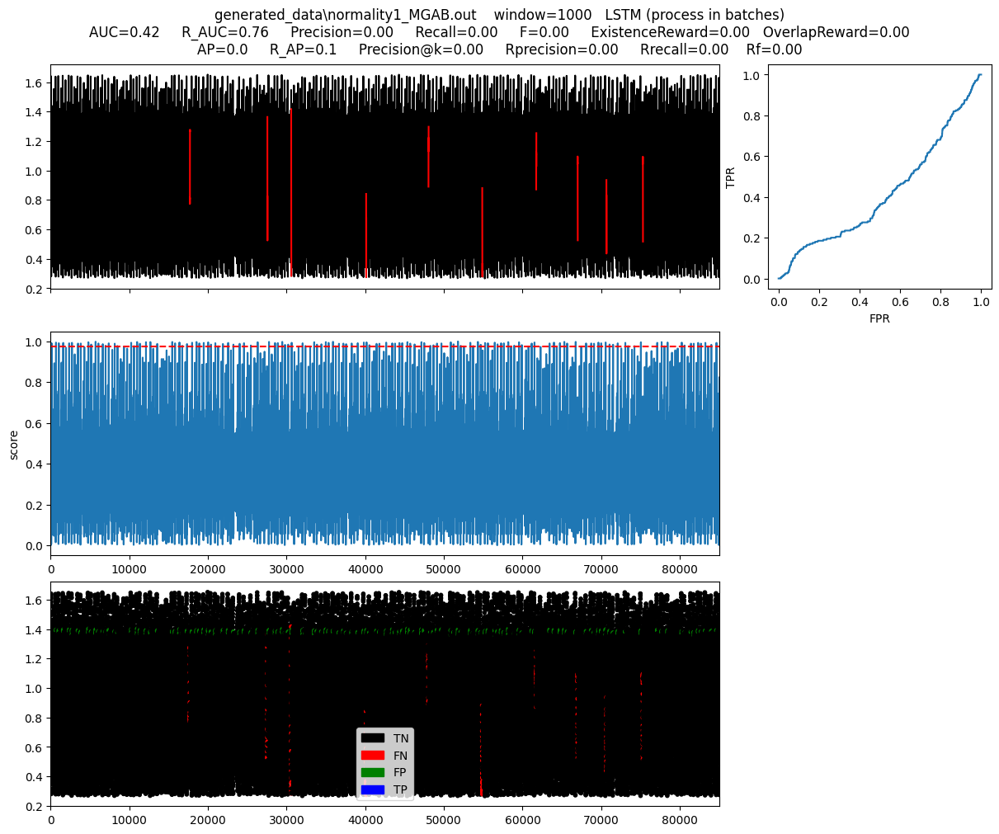

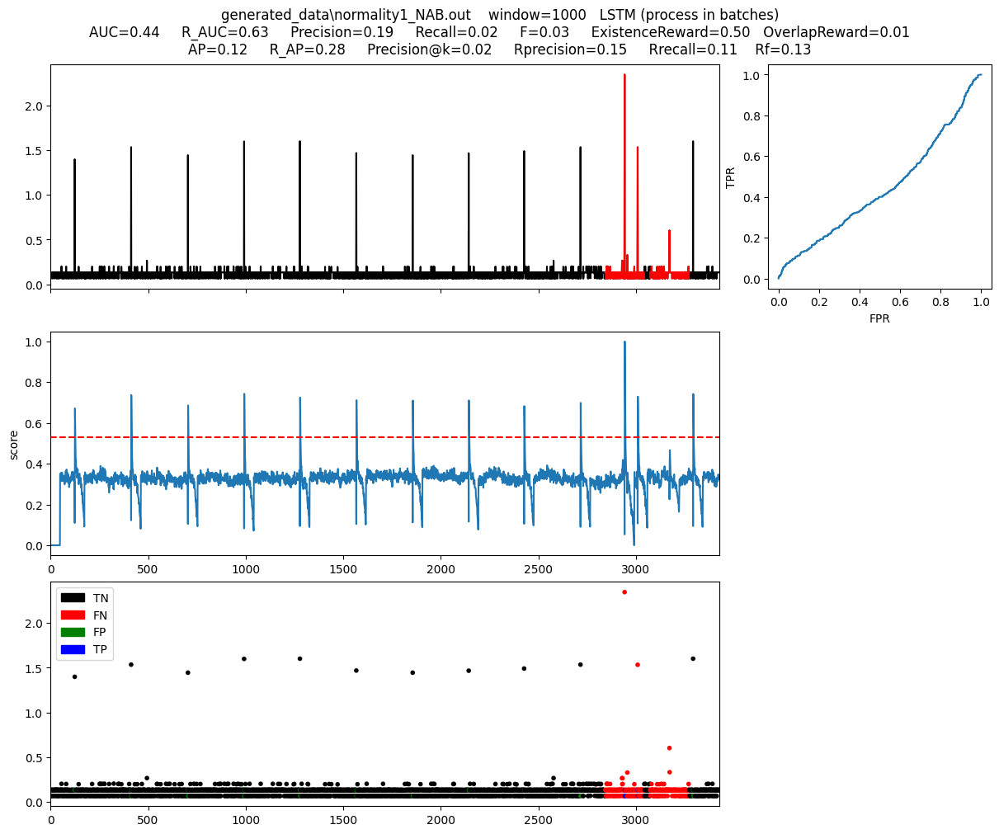

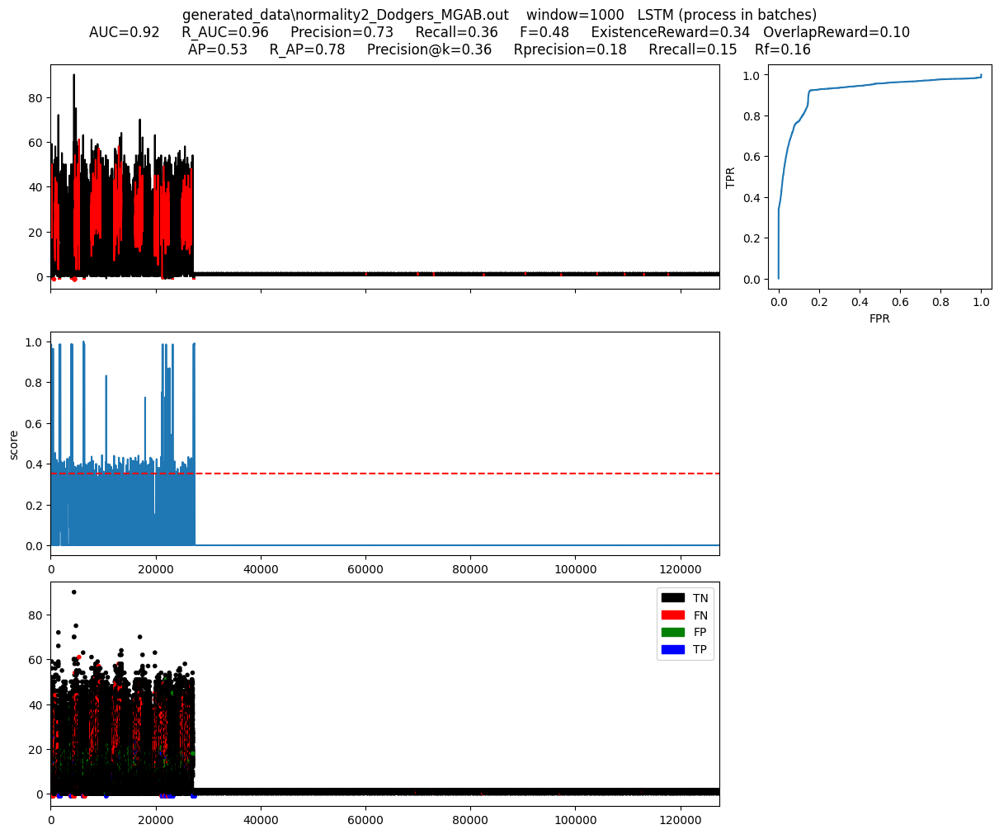

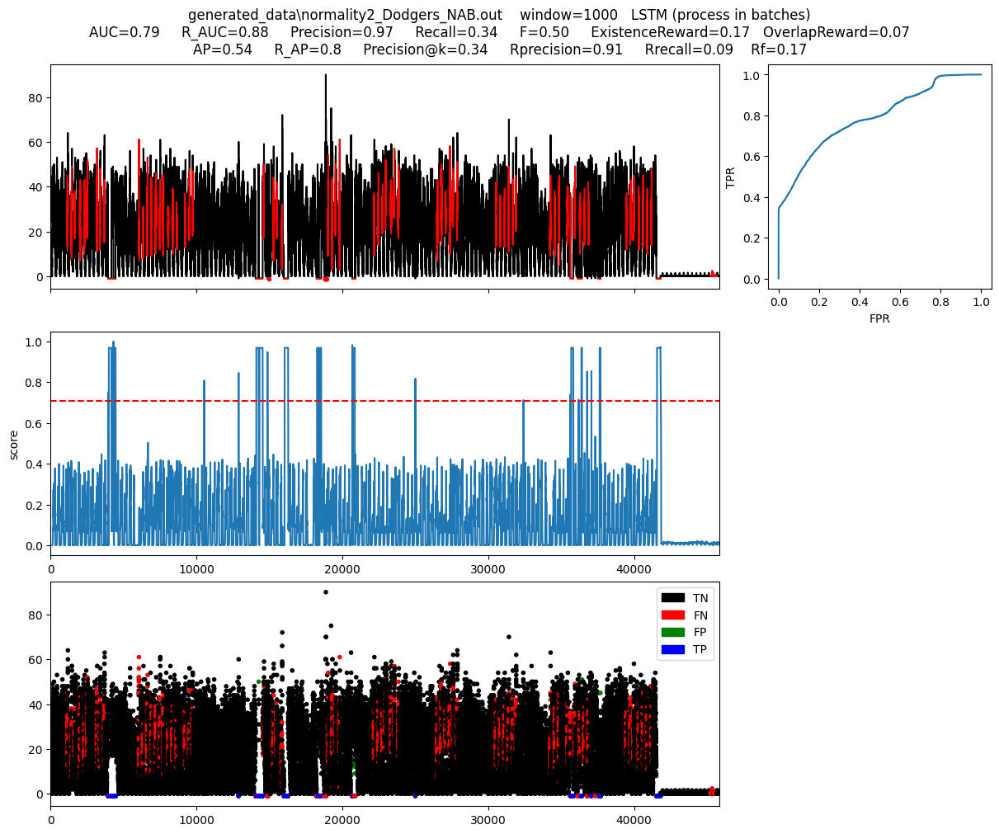

...

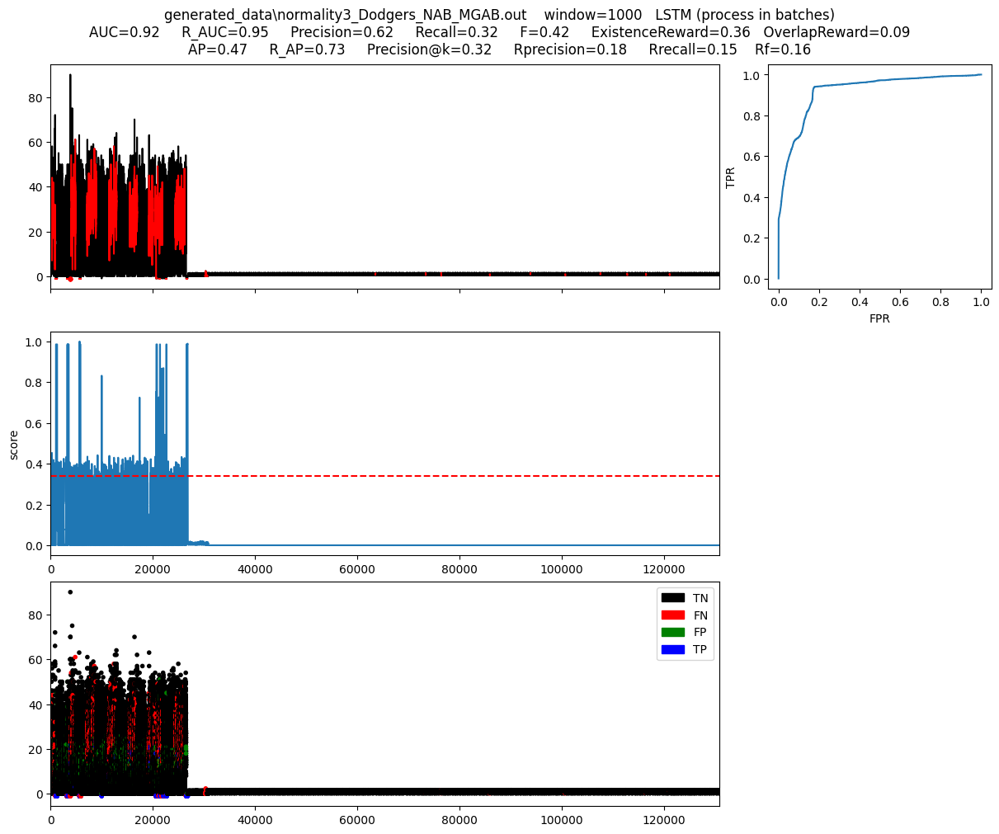

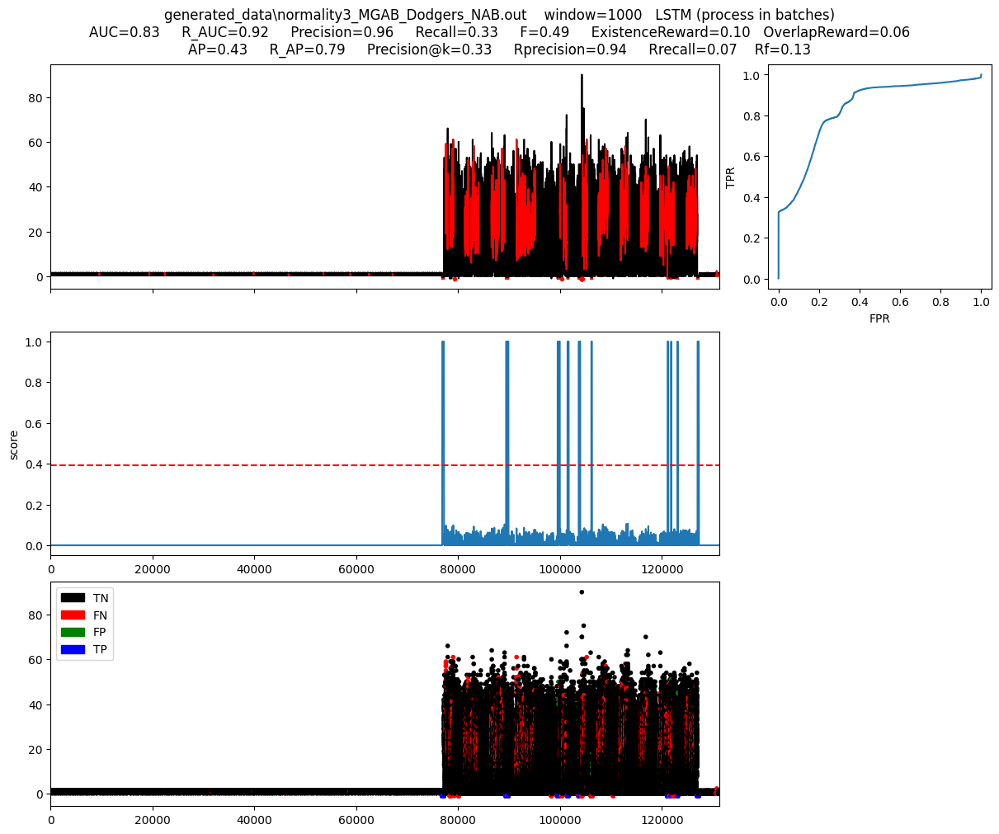

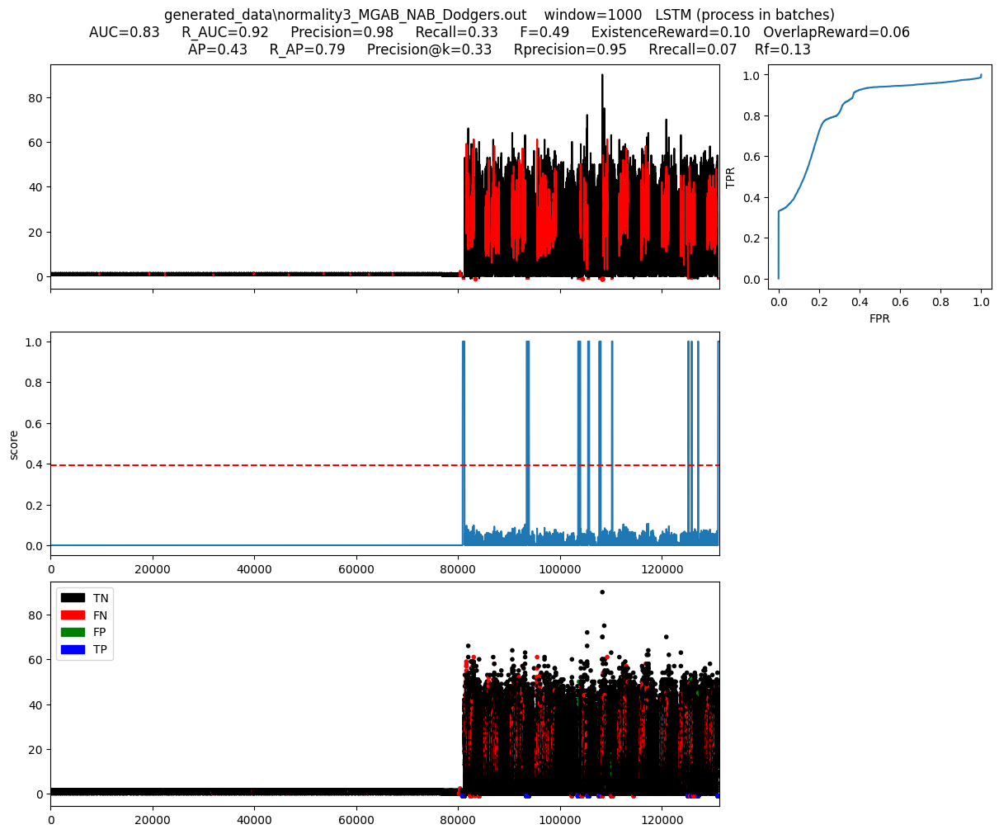

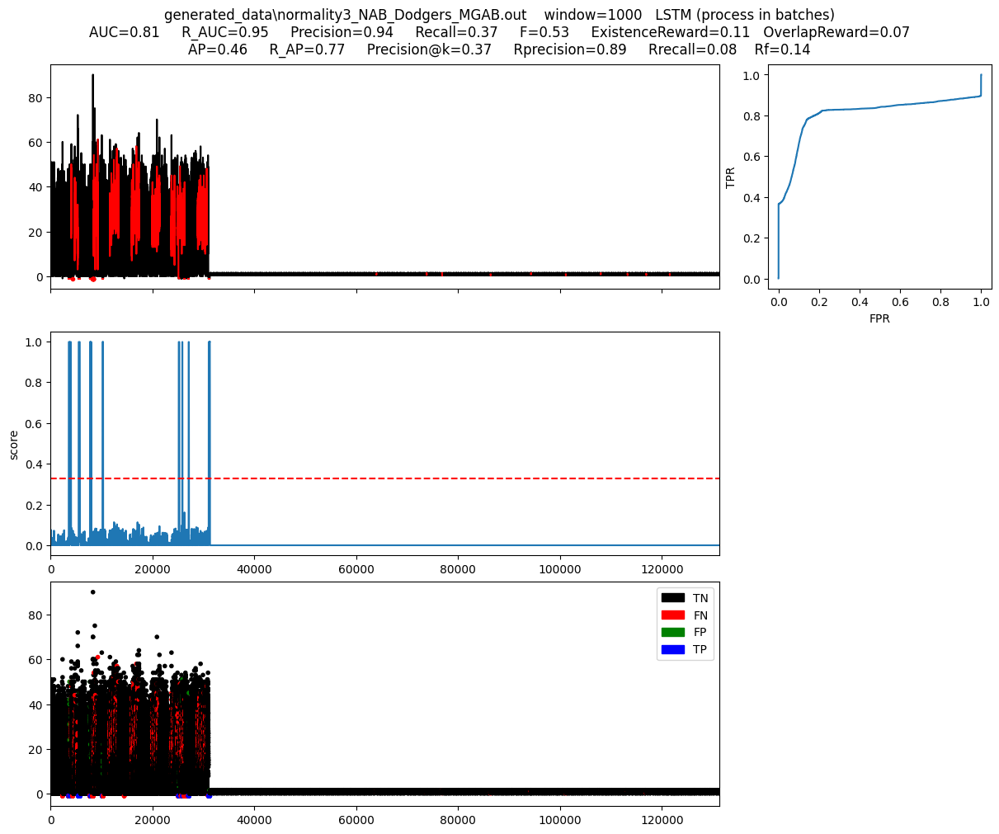

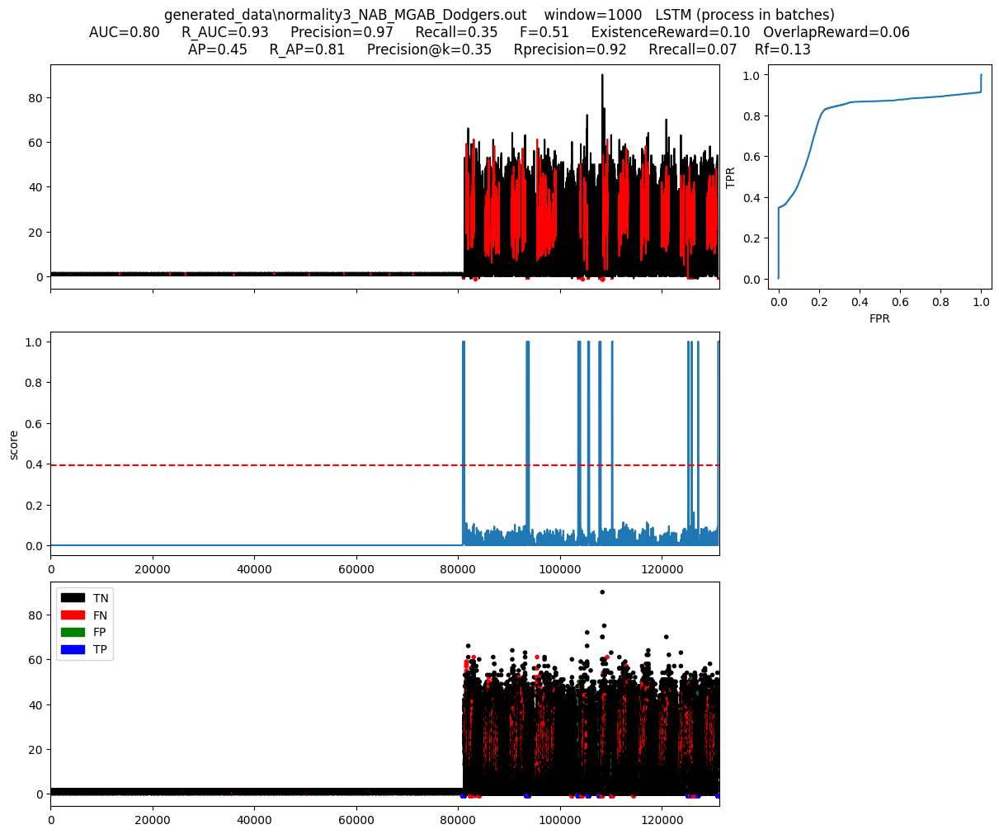

In [11]:
for filepath in file_paths:
    name, slidingWindow, data, label, X_train, y_train, X_test, y_test = data_preprocessing(filepath)
    X_test_reshaped = X_test.reshape((-1, 1, 1))

    model = models[filepath]
    # Process test data in batches to simulate streaming
    score = process_in_batches(model, X_test, batch_size=BATCH_SIZE)
    
    zeros = np.zeros(WINDOW_SIZE-1)
    new_score = np.concatenate((zeros,score))
    plotFig(X_test, y_test, new_score, BATCH_SIZE, fileName=name, modelName="LSTM (process in batches)")

### Variation 2 - Process in batches with pseudo labeling

generated_data\normality1_Dodgers.out
Estimated Subsequence length:  288
Time series length:  49900
Number of abnormal points:  5233


Processing batches: 100%|██████████| 43/43 [01:57<00:00,  2.74s/it]


generated_data\normality1_MGAB.out
Estimated Subsequence length:  49
Time series length:  100000
Number of abnormal points:  200


Processing batches: 100%|██████████| 85/85 [03:51<00:00,  2.73s/it]


generated_data\normality1_NAB.out
Estimated Subsequence length:  289
Time series length:  4031
Number of abnormal points:  400


Processing batches: 100%|██████████| 4/4 [00:04<00:00,  1.12s/it]


generated_data\normality2_Dodgers_MGAB.out
Estimated Subsequence length:  288
Time series length:  149900
Number of abnormal points:  5433


Processing batches: 100%|██████████| 128/128 [05:01<00:00,  2.36s/it]


generated_data\normality2_Dodgers_NAB.out
Estimated Subsequence length:  288
Time series length:  53931
Number of abnormal points:  5633


Processing batches: 100%|██████████| 46/46 [01:36<00:00,  2.10s/it]


generated_data\normality2_MGAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  150400
Number of abnormal points:  5812


Processing batches: 100%|██████████| 128/128 [05:17<00:00,  2.48s/it]


generated_data\normality2_MGAB_NAB.out
Estimated Subsequence length:  49
Time series length:  104031
Number of abnormal points:  600


Processing batches: 100%|██████████| 89/89 [03:34<00:00,  2.41s/it]


generated_data\normality2_NAB_Dodgers.out
Estimated Subsequence length:  288
Time series length:  54431
Number of abnormal points:  6012


Processing batches: 100%|██████████| 47/47 [01:40<00:00,  2.14s/it]


generated_data\normality2_NAB_MGAB.out
Estimated Subsequence length:  49
Time series length:  104031
Number of abnormal points:  600


Processing batches: 100%|██████████| 89/89 [03:22<00:00,  2.28s/it]


generated_data\normality3_Dodgers_MGAB_NAB.out
Estimated Subsequence length:  288
Time series length:  153931
Number of abnormal points:  5833


Processing batches: 100%|██████████| 131/131 [05:08<00:00,  2.35s/it]


generated_data\normality3_Dodgers_NAB_MGAB.out
Estimated Subsequence length:  288
Time series length:  153931
Number of abnormal points:  5833


Processing batches: 100%|██████████| 131/131 [05:09<00:00,  2.36s/it]


generated_data\normality3_MGAB_Dodgers_NAB.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [05:13<00:00,  2.38s/it]


generated_data\normality3_MGAB_NAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [07:34<00:00,  3.44s/it]


generated_data\normality3_NAB_Dodgers_MGAB.out
Estimated Subsequence length:  288
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [08:11<00:00,  3.73s/it]


generated_data\normality3_NAB_MGAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [08:35<00:00,  3.90s/it]


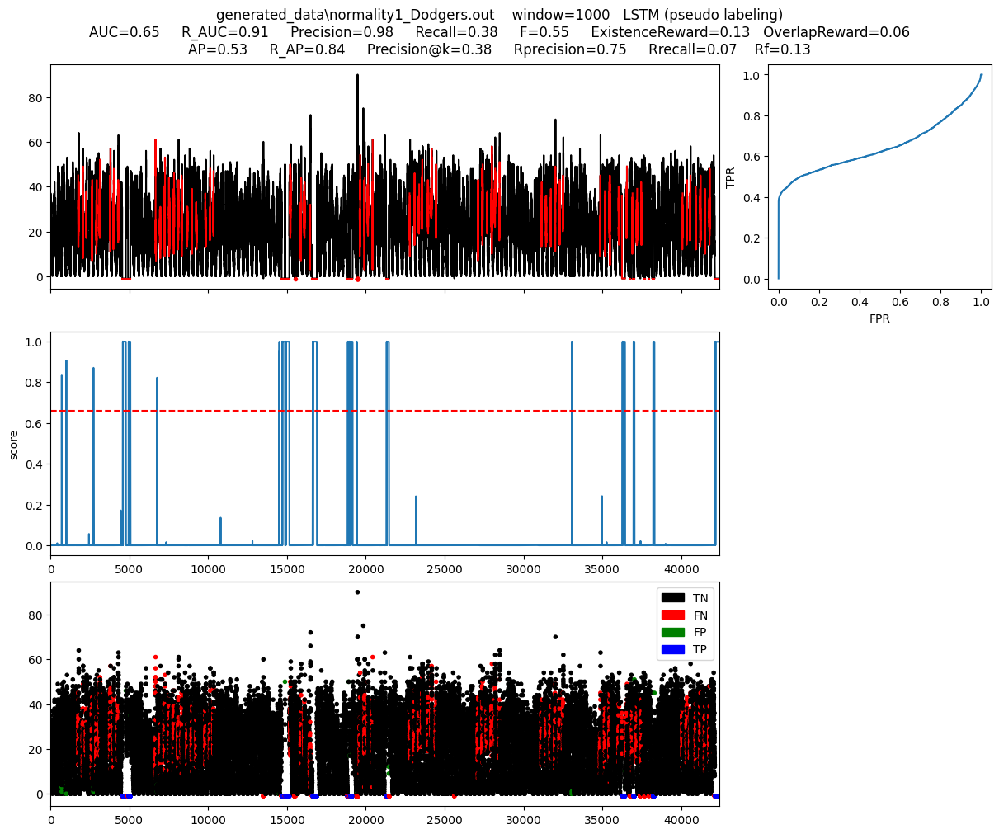

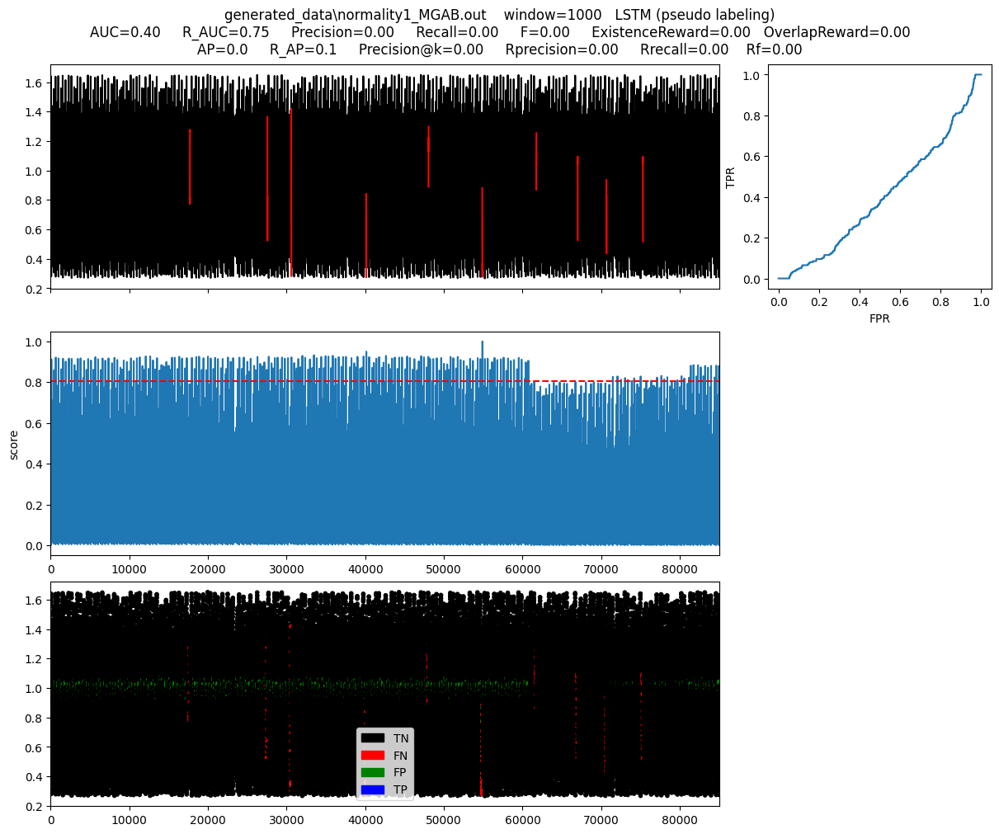

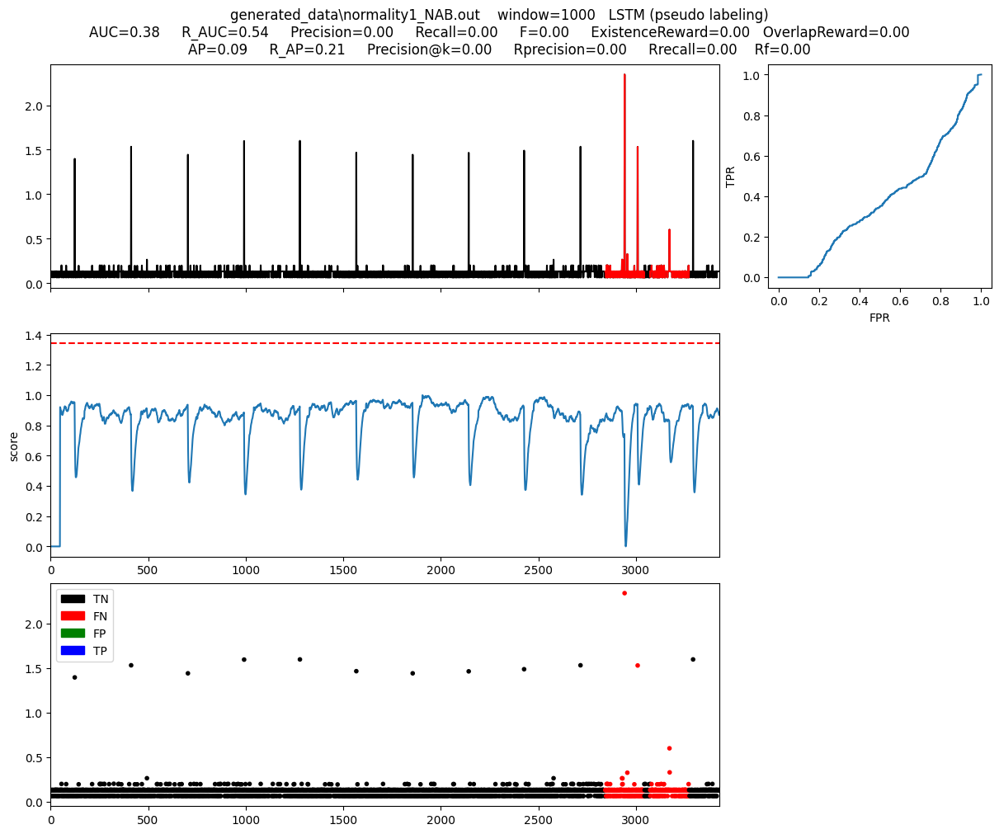

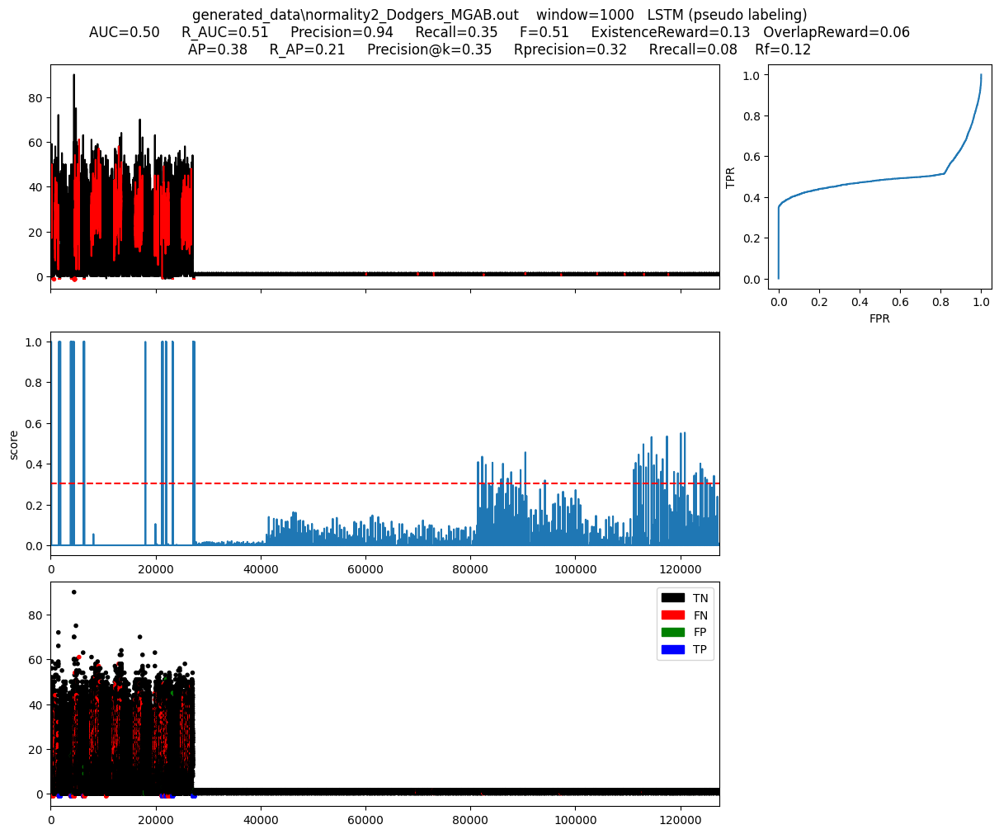

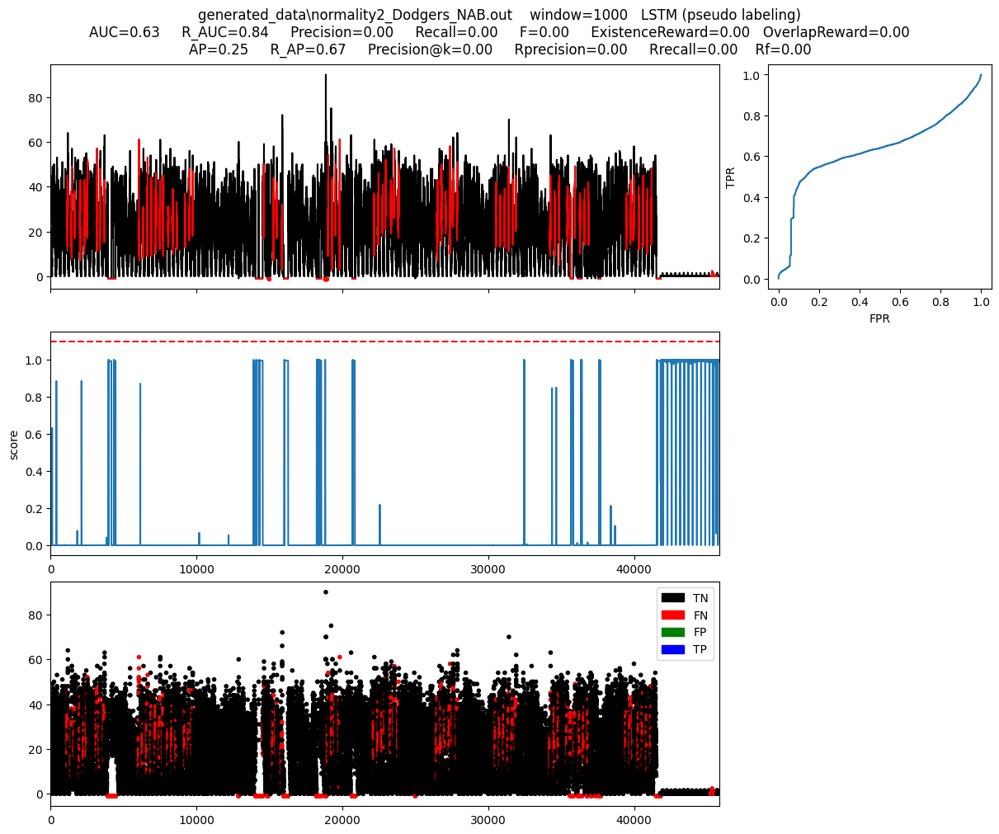

...

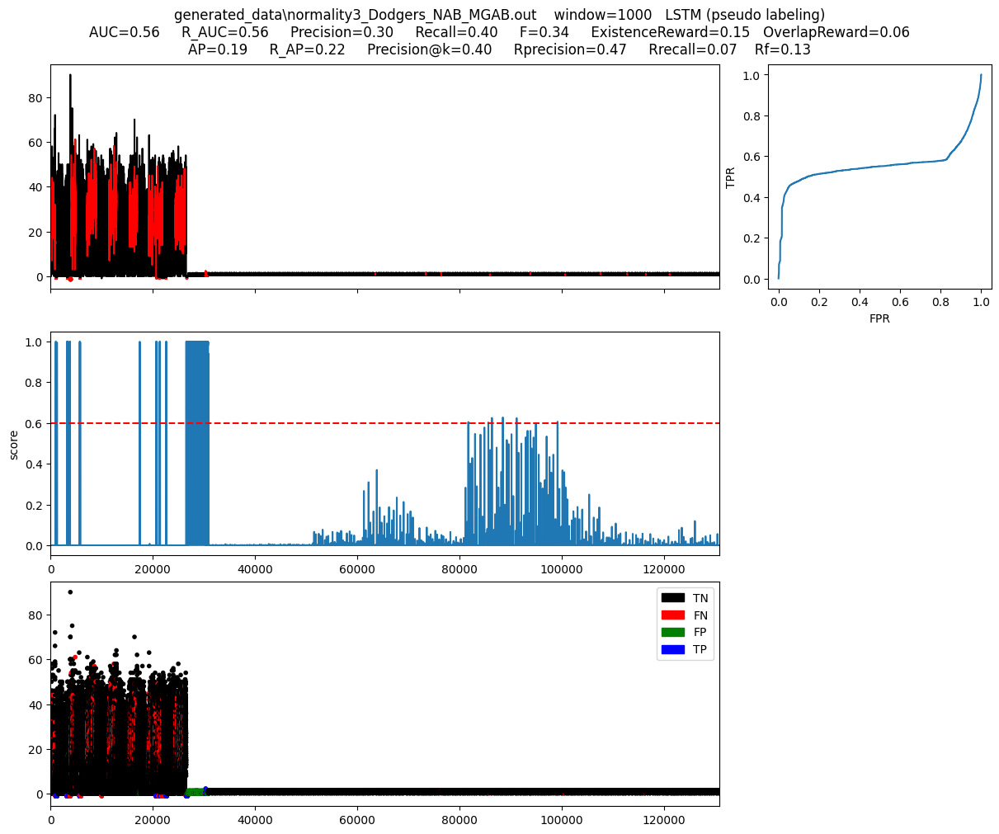

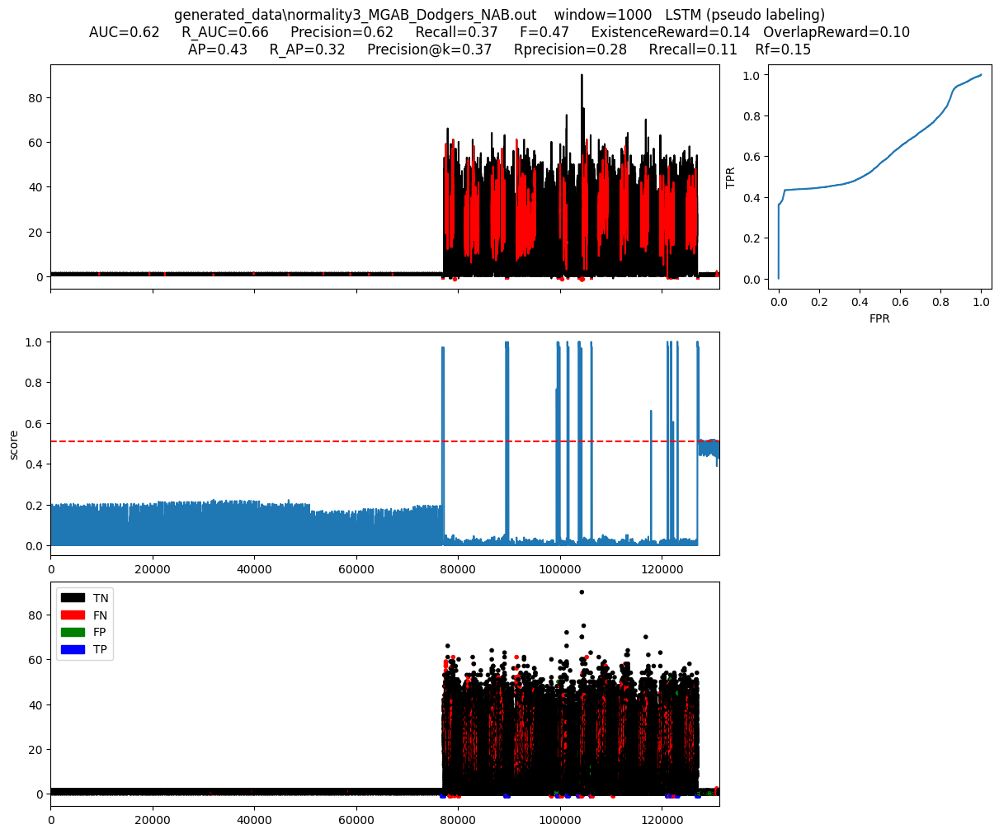

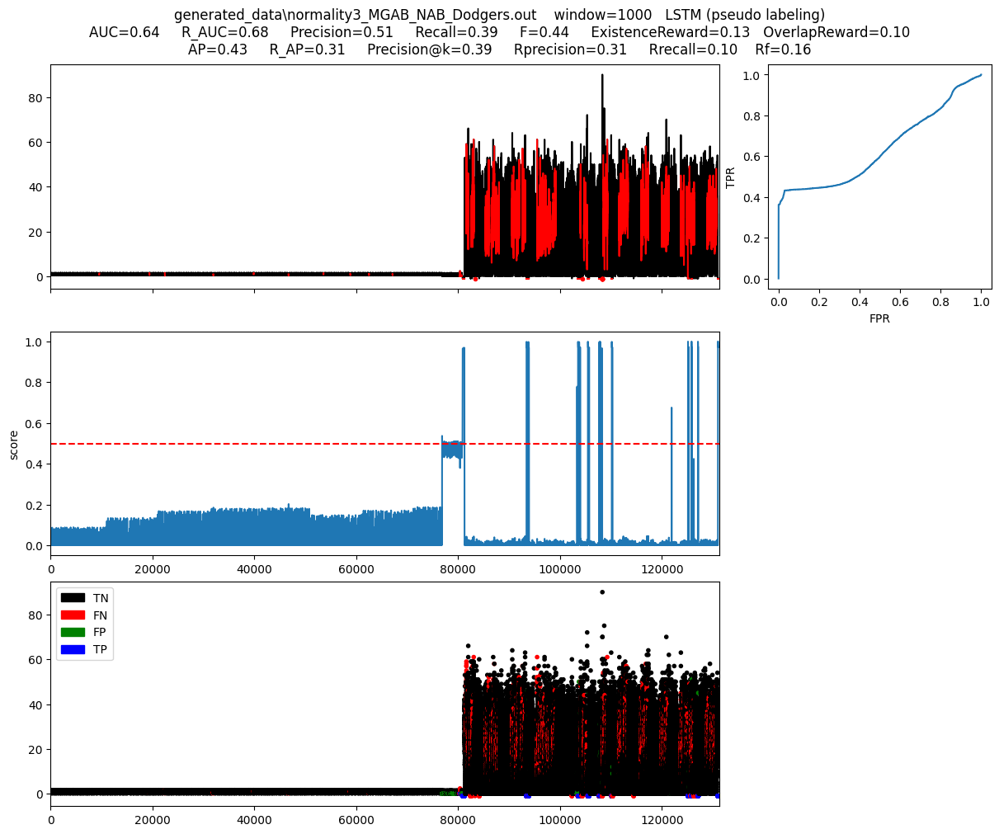

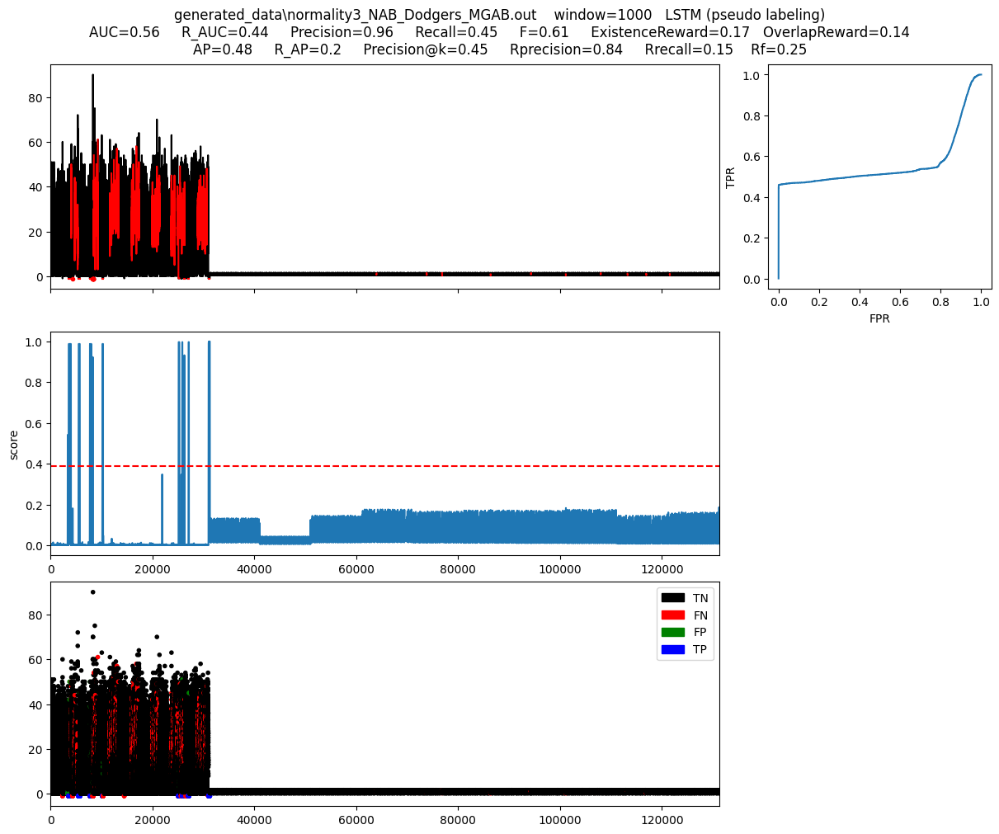

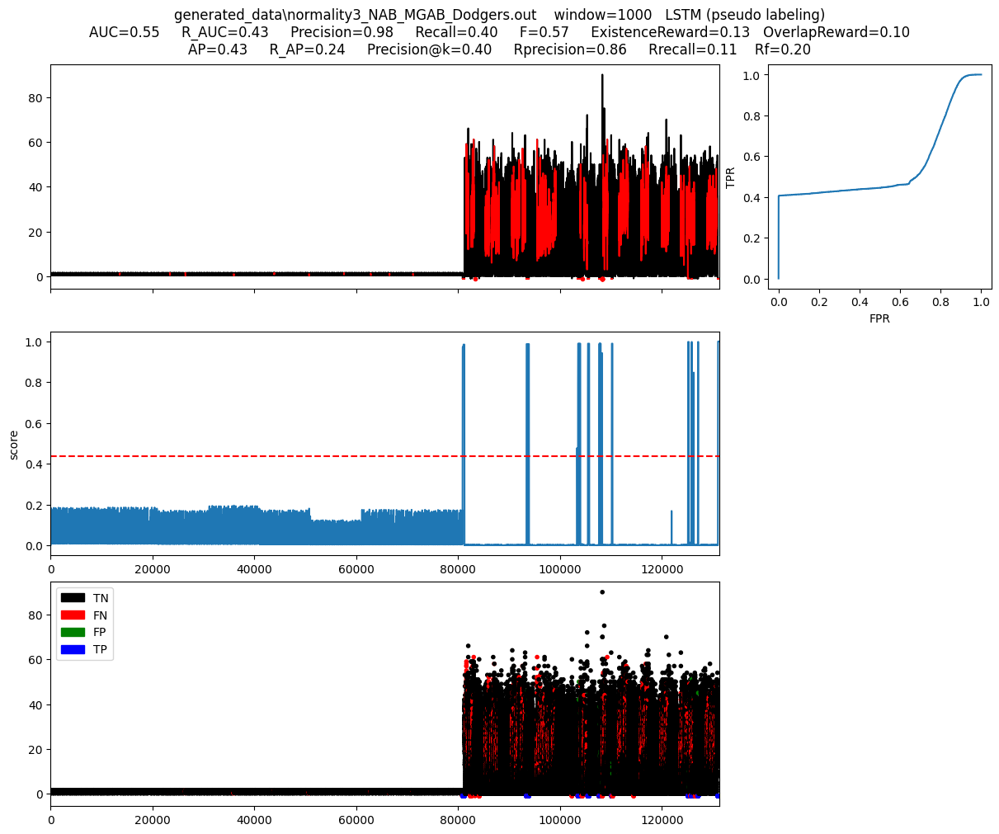

In [14]:
for filepath in file_paths:
    name, slidingWindow, data, label, X_train, y_train, X_test, y_test = data_preprocessing(filepath)
    X_test_reshaped = X_test.reshape((-1, 1, 1))

    model = models[filepath]
    # Process test data in batches to simulate streaming
    score = process_in_batches_with_pseudo_labeling(model, X_test, batch_size=BATCH_SIZE, confidence_threshold=0.8)

    zeros = np.zeros(WINDOW_SIZE-1)
    new_score = np.concatenate((zeros,score))
    plotFig(X_test, y_test, new_score, BATCH_SIZE, fileName=name, modelName="LSTM (pseudo labeling)")

### Variation 3 - Process with general model in batches

In [15]:
combined_X_train_data = []
combined_X_val_data = []
combined_y_train_data = []
combined_y_val_data = []

for filepath in file_paths[:3]:

    name, slidingWindow, data, label, X_train_val, y_train_val, X_test, y_test = data_preprocessing(filepath)

    X_train = X_train_val[:int(0.8*len(X_train_val))]
    y_train = y_train_val[:int(0.8*len(X_train_val))]
    X_val = X_train_val[int(0.8*len(X_train_val)):]
    y_val = y_train_val[int(0.8*len(X_train_val)):]    
    combined_X_train_data.append(X_train)
    combined_y_train_data.append(y_train)
    combined_X_val_data.append(X_val)
    combined_y_val_data.append(y_val)

X_train_combined = np.concatenate(combined_X_train_data)
y_train_combined = np.concatenate(combined_y_train_data)
X_val_combined = np.concatenate(combined_X_val_data)
y_val_combined = np.concatenate(combined_y_val_data)

start_time = time()
combined_model = train_lstm_model(X_train_combined.reshape((-1, 1, 1)), y_train_combined, X_val=X_val_combined.reshape((-1, 1, 1)), y_val=y_val_combined)
end_time = time()
models['Combined_data'] = combined_model
print(f"General model trained succesfuly in {(end_time-start_time):.1f} s.")


generated_data\normality1_Dodgers.out
Estimated Subsequence length:  288
Time series length:  49900
Number of abnormal points:  5233
generated_data\normality1_MGAB.out
Estimated Subsequence length:  49
Time series length:  100000
Number of abnormal points:  200
generated_data\normality1_NAB.out
Estimated Subsequence length:  289
Time series length:  4031
Number of abnormal points:  400
General model trained succesfuly in 535.0 s.


generated_data\normality1_Dodgers.out
Estimated Subsequence length:  288
Time series length:  49900
Number of abnormal points:  5233


Processing batches: 100%|██████████| 43/43 [01:00<00:00,  1.40s/it]


generated_data\normality1_MGAB.out
Estimated Subsequence length:  49
Time series length:  100000
Number of abnormal points:  200


Processing batches: 100%|██████████| 85/85 [02:11<00:00,  1.55s/it]


generated_data\normality1_NAB.out
Estimated Subsequence length:  289
Time series length:  4031
Number of abnormal points:  400


Processing batches: 100%|██████████| 4/4 [00:05<00:00,  1.25s/it]


generated_data\normality2_Dodgers_MGAB.out
Estimated Subsequence length:  288
Time series length:  149900
Number of abnormal points:  5433


Processing batches: 100%|██████████| 128/128 [03:33<00:00,  1.66s/it]


generated_data\normality2_Dodgers_NAB.out
Estimated Subsequence length:  288
Time series length:  53931
Number of abnormal points:  5633


Processing batches: 100%|██████████| 46/46 [01:12<00:00,  1.57s/it]


generated_data\normality2_MGAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  150400
Number of abnormal points:  5812


Processing batches: 100%|██████████| 128/128 [03:11<00:00,  1.50s/it]


generated_data\normality2_MGAB_NAB.out
Estimated Subsequence length:  49
Time series length:  104031
Number of abnormal points:  600


Processing batches: 100%|██████████| 89/89 [02:16<00:00,  1.54s/it]


generated_data\normality2_NAB_Dodgers.out
Estimated Subsequence length:  288
Time series length:  54431
Number of abnormal points:  6012


Processing batches: 100%|██████████| 47/47 [01:17<00:00,  1.64s/it]


generated_data\normality2_NAB_MGAB.out
Estimated Subsequence length:  49
Time series length:  104031
Number of abnormal points:  600


Processing batches: 100%|██████████| 89/89 [01:27<00:00,  1.02it/s]


generated_data\normality3_Dodgers_MGAB_NAB.out
Estimated Subsequence length:  288
Time series length:  153931
Number of abnormal points:  5833


Processing batches: 100%|██████████| 131/131 [02:03<00:00,  1.06it/s]


generated_data\normality3_Dodgers_NAB_MGAB.out
Estimated Subsequence length:  288
Time series length:  153931
Number of abnormal points:  5833


Processing batches: 100%|██████████| 131/131 [01:47<00:00,  1.22it/s]


generated_data\normality3_MGAB_Dodgers_NAB.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [02:06<00:00,  1.04it/s]


generated_data\normality3_MGAB_NAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [01:57<00:00,  1.12it/s]


generated_data\normality3_NAB_Dodgers_MGAB.out
Estimated Subsequence length:  288
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [02:00<00:00,  1.09it/s]


generated_data\normality3_NAB_MGAB_Dodgers.out
Estimated Subsequence length:  49
Time series length:  154431
Number of abnormal points:  6212


Processing batches: 100%|██████████| 132/132 [02:05<00:00,  1.05it/s]


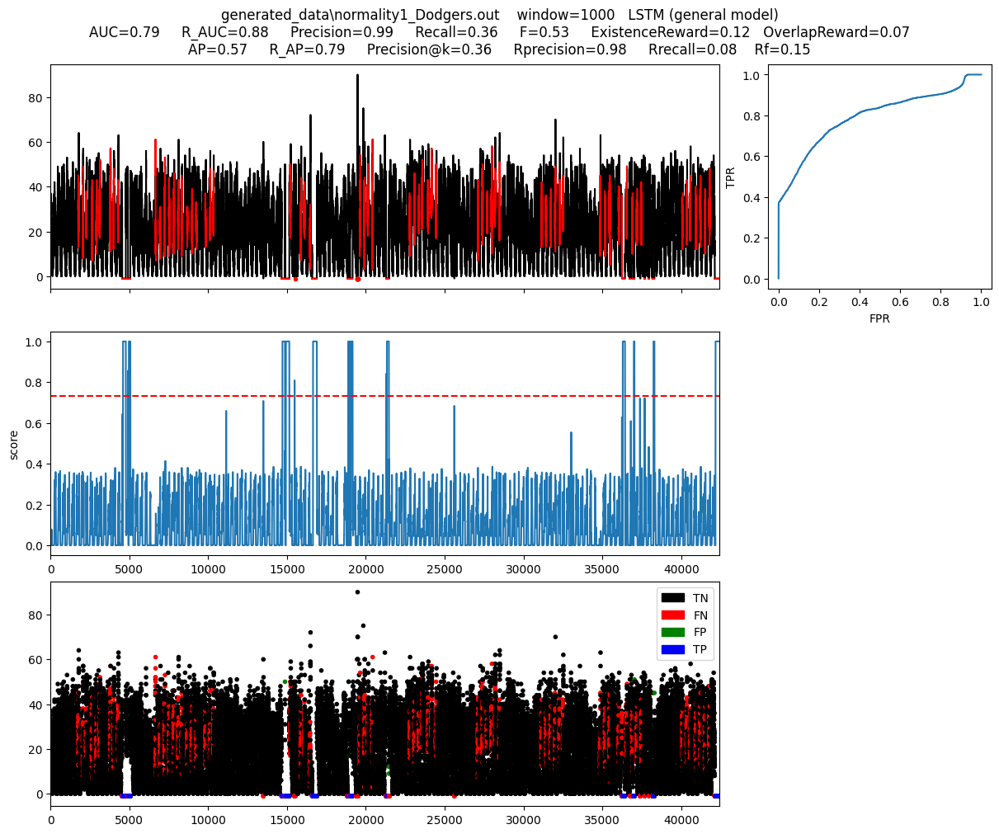

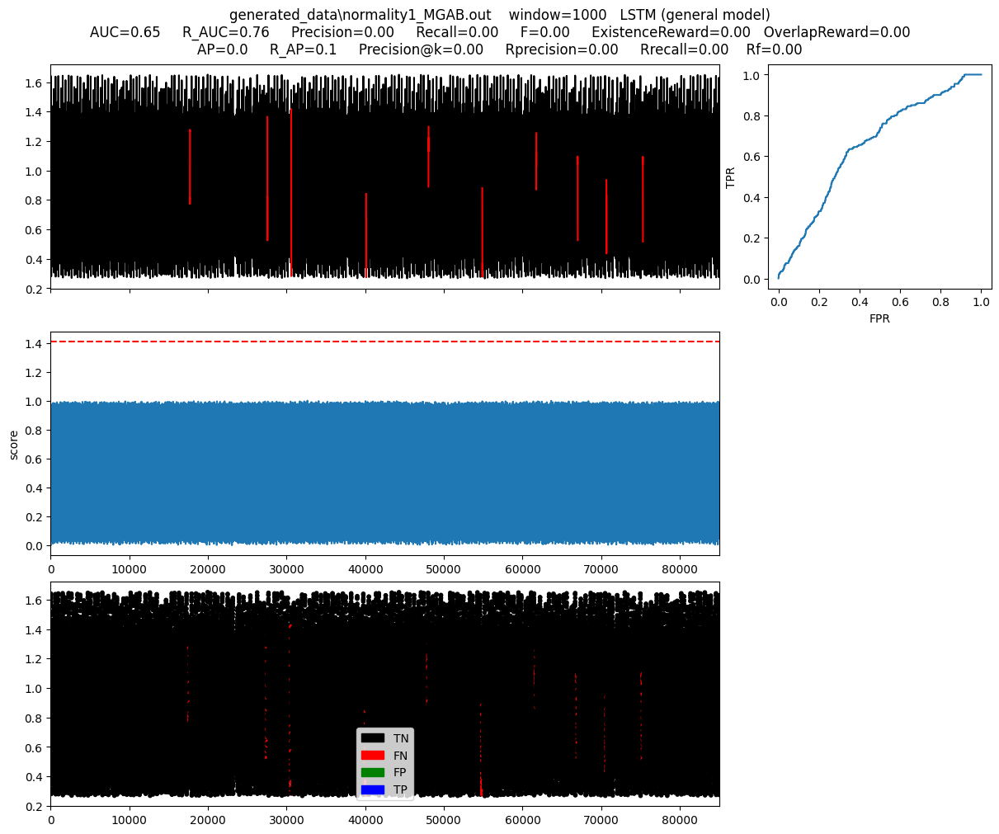

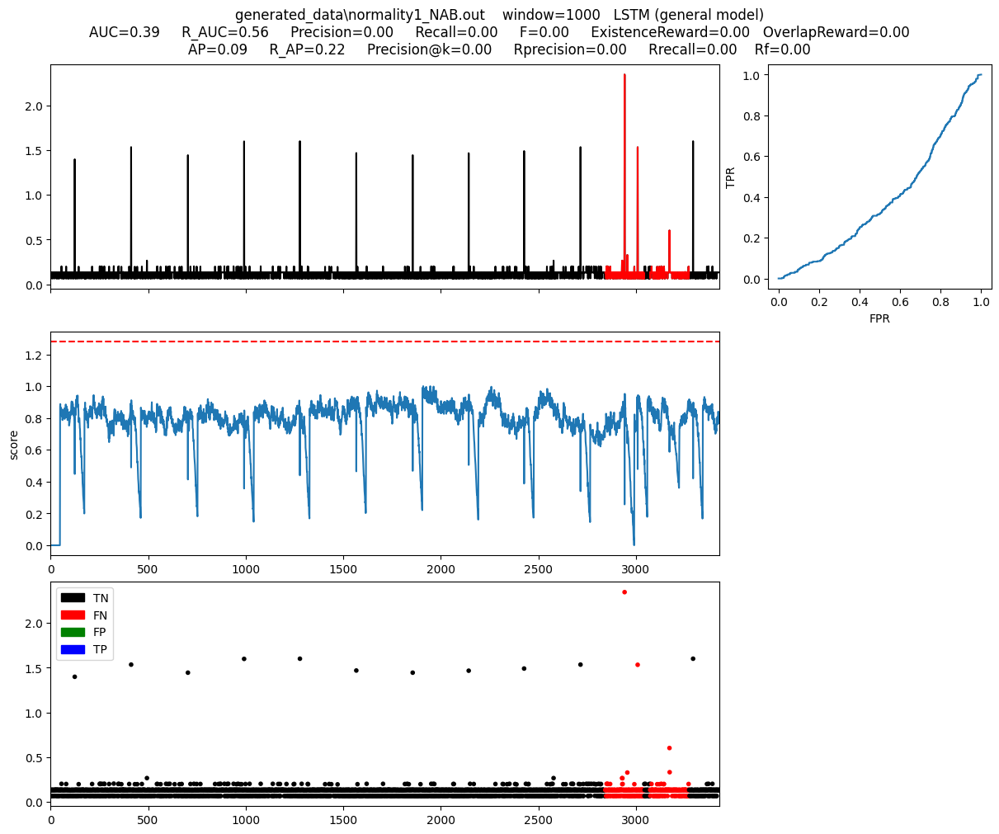

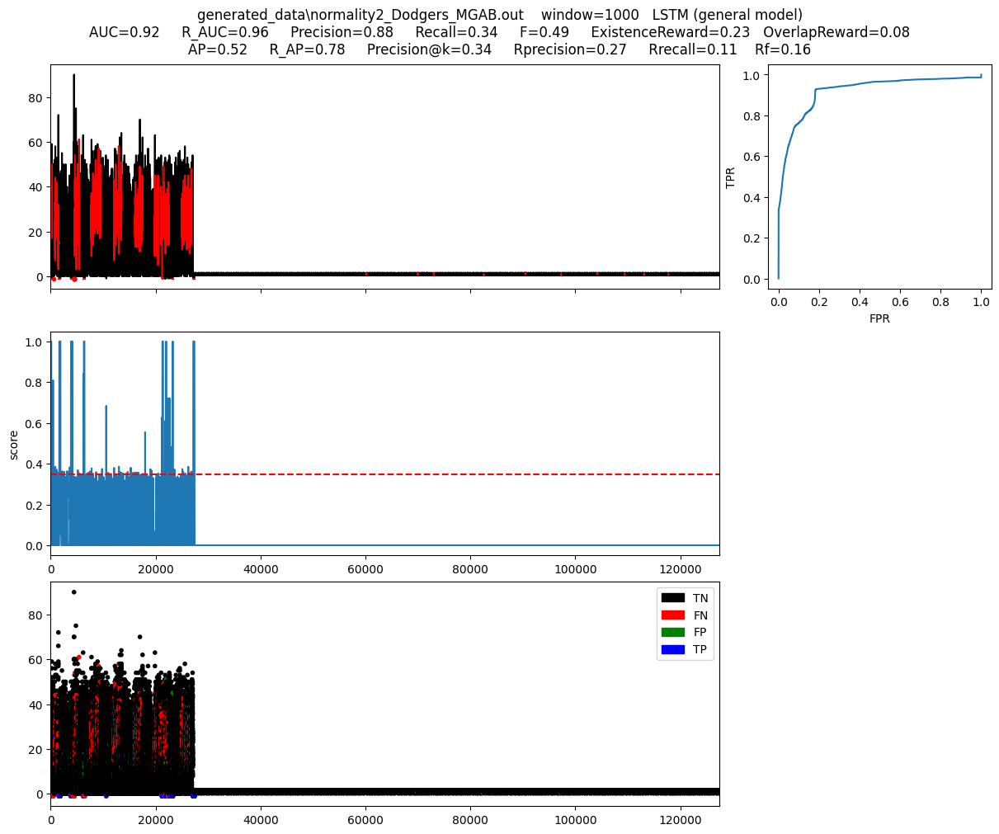

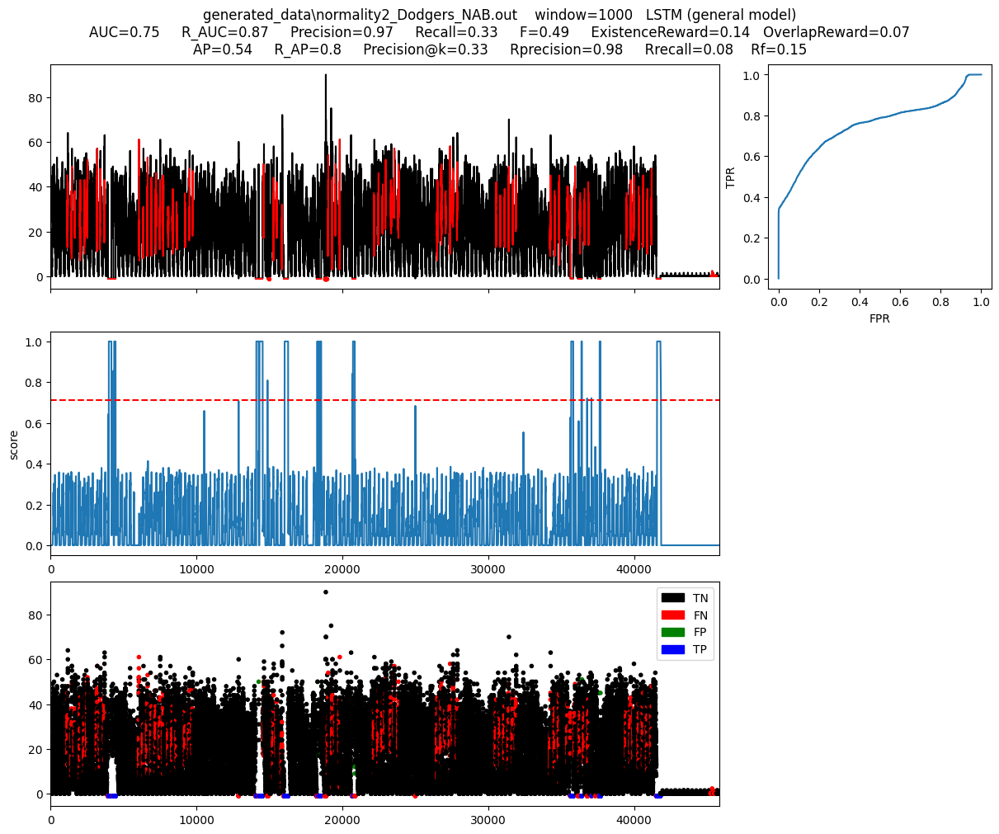

...

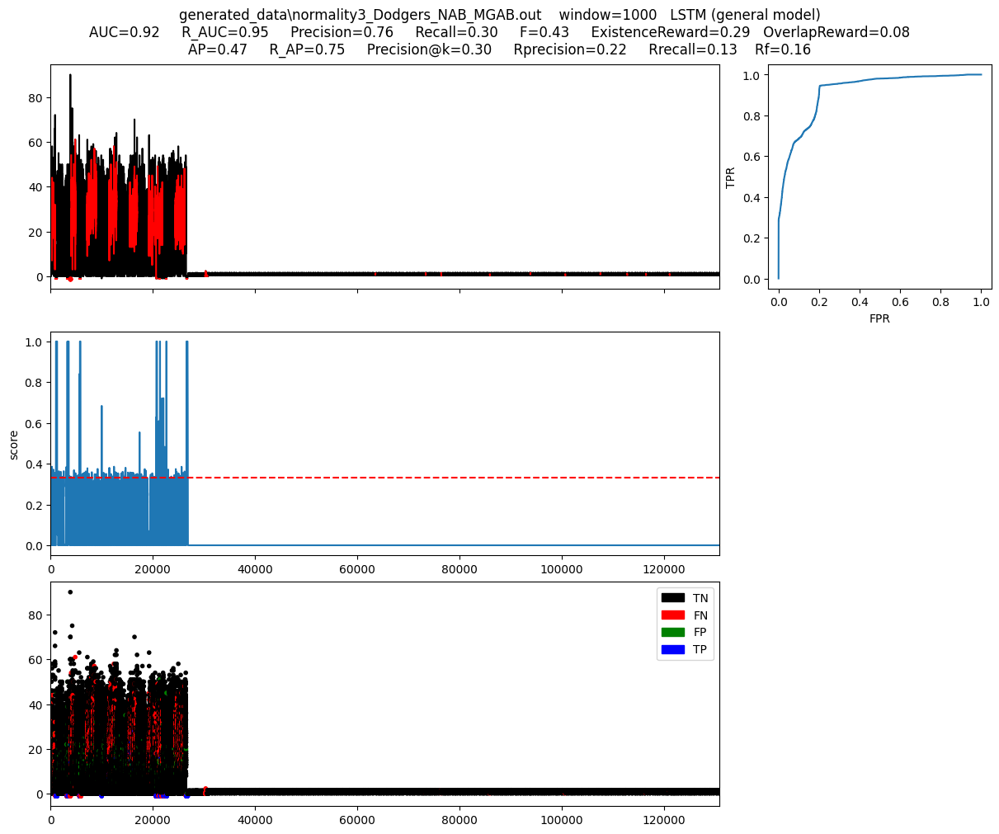

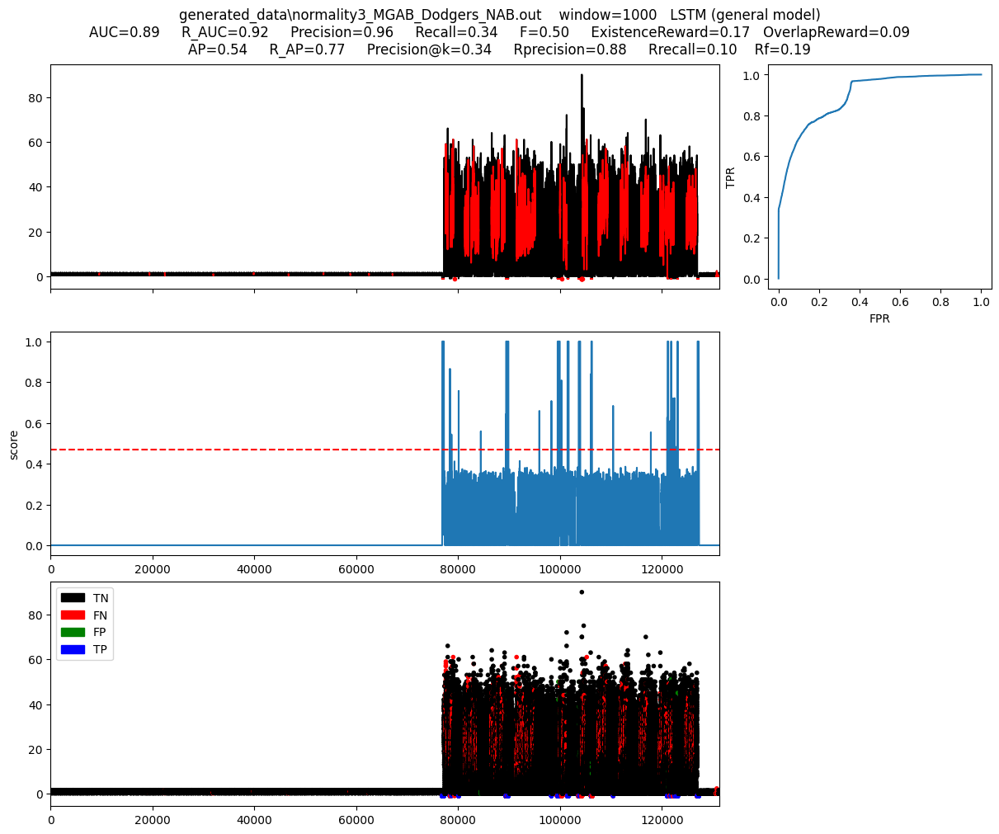

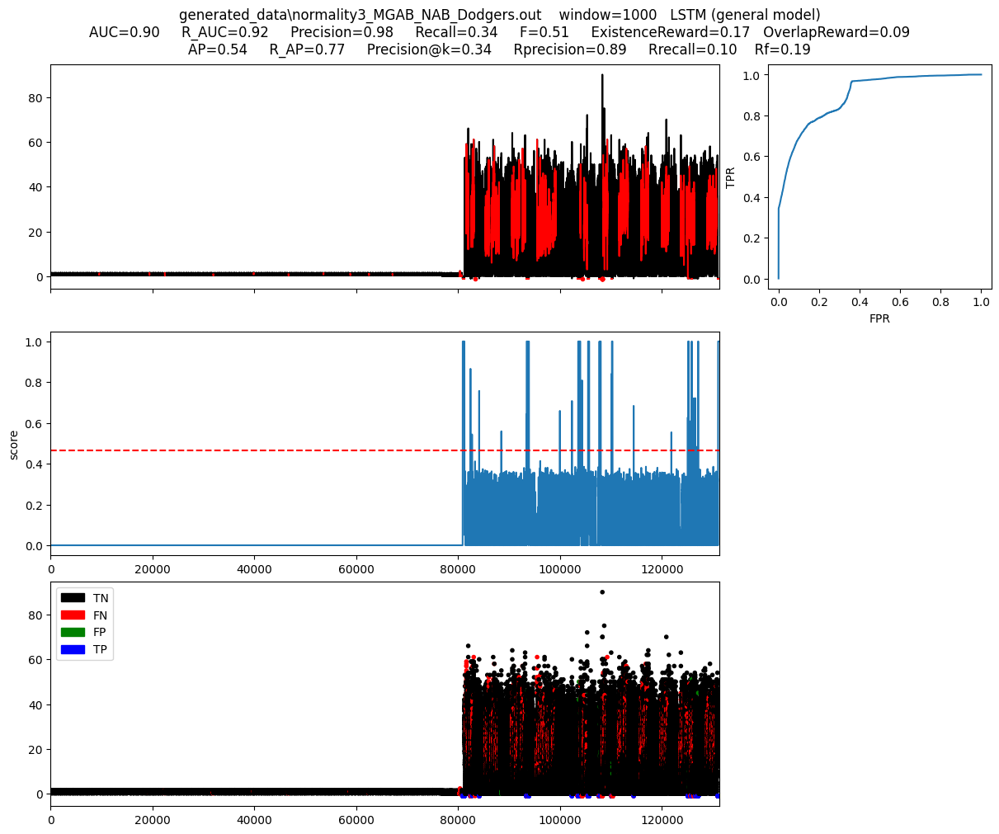

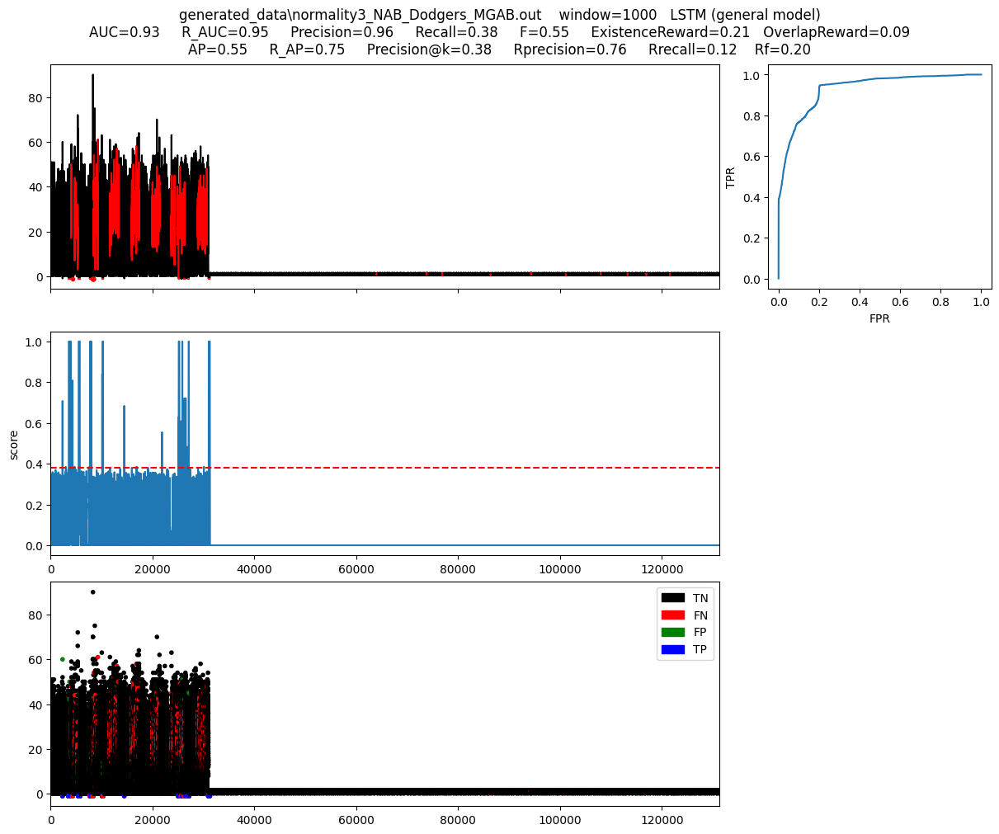

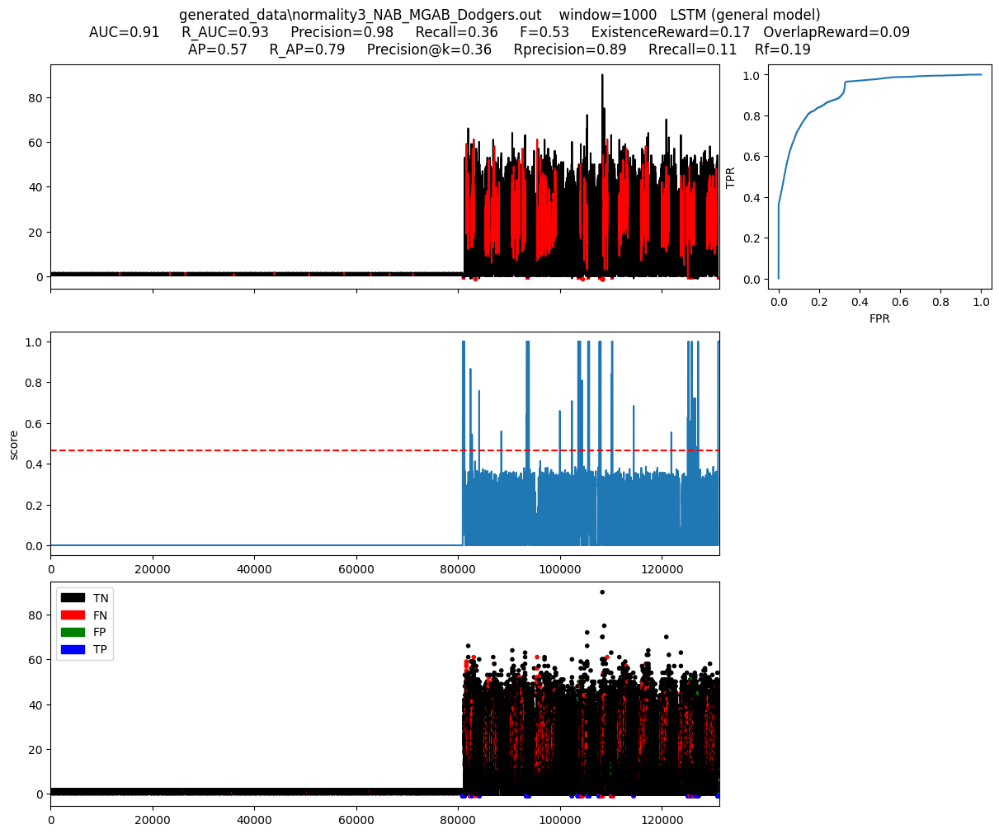

In [16]:
for filepath in file_paths:
    name, slidingWindow, data, label, X_train, y_train, X_test, y_test = data_preprocessing(filepath)
    X_test_reshaped = X_test.reshape((-1, 1, 1))

    model = models['Combined_data']
    # Process test data in batches to simulate streaming
    score = process_in_batches(model, X_test, batch_size=BATCH_SIZE)
    
    zeros = np.zeros(WINDOW_SIZE-1)
    new_score = np.concatenate((zeros,score))
    plotFig(X_test, y_test, new_score, BATCH_SIZE, fileName=name, modelName="LSTM (general model)")